# Meghna Lohani 16BCE1395

# Lab 6 - Decision Tree (24-01-19)

Prof. Tulasi Prasad Sariki

In [6]:
#Decision tree builds classification or regression models in the form of a tree structure.
#It breaks down a dataset into smaller and smaller subsets while at the same time an associated decision tree
#is incrementally developed.
#The final result is a tree with decision nodes and leaf nodes.

In [7]:
#importing respective libraries and setting up the enviornment

'''data working libraries'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree, metrics

'''data visualisation libraries'''
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
py.offline.init_notebook_mode(connected=True)
%matplotlib inline

In [8]:
#loading the data
crs=pd.read_csv('CreditScoring.csv')

In [9]:
crs.head()

,Status,Seniority,Home,Time,Age,Marital,Records,Job,Expenses,Income,Assets,Debt,Amount,Price
0,1,9,1,60,30,2,1,3,73,129,0,0,800,846
1,1,17,1,60,58,3,1,1,48,131,0,0,1000,1658
2,2,10,2,36,46,2,2,3,90,200,3000,0,2000,2985
3,1,0,1,60,24,1,1,1,63,182,2500,0,900,1325
4,1,0,1,36,26,1,1,1,46,107,0,0,310,910


In [10]:
#setting up our x and y variables correspondingly
x = crs.iloc[:,:-1]
y = crs.iloc[:,-1]

In [11]:
#testing and splitting the data
from distutils.version import LooseVersion as Version

from sklearn import __version__ as sklearn_version
if Version(sklearn_version) < '0.18':
    from sklearn.cross_validation import train_test_split
else:
    from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.3,random_state=0)

In [12]:
#concatinating the x and y np arrays into a single np array so that can be 
#converted to a dataframe later on
data=np.c_[x,y]

In [13]:
#making a header list for corresponding column indices in DF
cols=['Status','Seniority','Home','Time','Age','Marital','Records','Job','Expenses','Income','Assets','Debt','Amount']
header=cols+['Price']
#converting into a dataframe for visualisation purposes
cs_df=pd.DataFrame(data=data,columns=header)

In [14]:
cs_df

,Status,Seniority,Home,Time,Age,Marital,Records,Job,Expenses,Income,Assets,Debt,Amount,Price
0,1,9,1,60,30,2,1,3,73,129,0,0,800,846
1,1,17,1,60,58,3,1,1,48,131,0,0,1000,1658
2,2,10,2,36,46,2,2,3,90,200,3000,0,2000,2985
3,1,0,1,60,24,1,1,1,63,182,2500,0,900,1325
4,1,0,1,36,26,1,1,1,46,107,0,0,310,910
5,1,1,2,60,36,2,1,1,75,214,3500,0,650,1645
6,1,29,2,60,44,2,1,1,75,125,10000,0,1600,1800
7,1,9,5,12,27,1,1,1,35,80,0,0,200,1093
8,1,0,2,60,32,2,1,3,90,107,15000,0,1200,1957
9,2,0,5,48,41,2,1,2,90,80,0,0,1200,1468


In [15]:
#Analysing the data
cs_df.shape

(4455, 14)

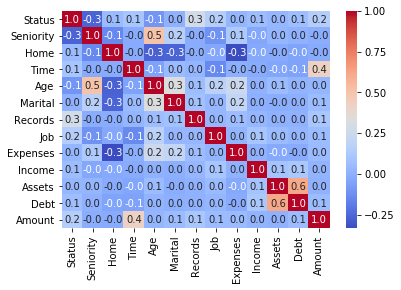

In [16]:
#the correlation matrix heatmap for analysing the correlation among features
corr_martix=cs_df[cols].corr()
sns.heatmap(corr_martix,cbar=True,annot=True,fmt='.1f',cmap='coolwarm');

The basic idea of decision trees is choosing particular values of 
particular features to split the data best(gain-ratio) and by this 
repeated process of splitting we keep refining the data until all we 
have got is simmilar type of labels in the branch or there are no features 
left to split upon .
So the basic idea rests upon asking the right questions.

In [17]:
class Question:
    #initialise column and value variables->
    
    def __init__(self,column,value):
        self.column=column
        self.value=value
    #it matches wheter the given data is in accordace with the value set or not
    #returns true and false accordingly
    def match(self,data):
        value=data[self.column]
        return value>=self.value
    # This is just a helper method to print
    # the question in a readable format.
    #def __repr__(self):
     #   condition = ">="
      #  return "Is %s %s %s?" % (
       #     header[self.column], condition, str(self.value))

In [18]:
#count the unique values of labels and store them in a dictionary
def count_values(rows):
    #will return a dictionary with species values as key and frequency as values
    count={}
    #takes whole dataset in as argument
    for row in  rows:
        #traverse on each datapoint
        label=row[-1]
        #labels are in the last column
        #if label is not even once come initialise it
        if label not in count:
            count[label]=0
        #increase the count of present label by 1
        count[label]+=1
    return count 

In [19]:
'''demo count function'''
count_values(data)

{4100: 1,
 6146: 1,
 4138: 1,
 690: 5,
 4200: 2,
 105: 1,
 125: 2,
 4250: 1,
 175: 1,
 200: 1,
 4300: 1,
 225: 1,
 240: 2,
 250: 1,
 270: 1,
 275: 1,
 280: 1,
 300: 9,
 4400: 2,
 315: 2,
 325: 3,
 350: 12,
 355: 1,
 360: 1,
 363: 1,
 365: 1,
 375: 11,
 380: 1,
 385: 1,
 400: 19,
 4500: 2,
 410: 1,
 420: 1,
 425: 9,
 428: 1,
 431: 1,
 434: 1,
 435: 1,
 440: 1,
 450: 22,
 460: 2,
 2126: 1,
 470: 2,
 475: 4,
 4575: 1,
 480: 2,
 490: 2,
 495: 3,
 500: 22,
 4600: 1,
 509: 1,
 510: 1,
 5200: 1,
 525: 8,
 530: 1,
 542: 1,
 545: 1,
 546: 1,
 549: 1,
 550: 25,
 555: 1,
 560: 1,
 570: 1,
 575: 6,
 580: 3,
 585: 3,
 587: 1,
 590: 4,
 600: 19,
 8800: 1,
 612: 1,
 615: 2,
 620: 2,
 625: 7,
 630: 1,
 635: 2,
 640: 2,
 645: 1,
 646: 1,
 650: 24,
 652: 1,
 660: 1,
 670: 3,
 4769: 1,
 675: 10,
 679: 1,
 680: 1,
 685: 1,
 687: 1,
 4786: 1,
 693: 1,
 700: 23,
 4800: 1,
 710: 4,
 715: 1,
 4812: 1,
 719: 1,
 720: 1,
 722: 1,
 724: 1,
 725: 4,
 730: 1,
 745: 1,
 748: 1,
 750: 22,
 808: 1,
 758: 2,
 760: 1,


In [20]:
#spliting the data based on the respective ques.
def partition(rows,question):
    #intialise two seprate lists 
    true_row,false_row=[],[]
    for row in rows:
        #traverse on each datapoint
        #match the given datapoint with the respective question
        if question.match(row):
            #if question.match returns true aka value is satisfied
            #append the given row in true row list
            true_row.append(row)
        else:
            false_row.append(row)
    return true_row,false_row

In [21]:
#now we need some method by which we can quantify this right question
#we are talking about.For this we use various methods like->

In [22]:
#gini impurity is defined as a measure of misclassification
#for eg is the data is pure(1 class only)
#then gini impurity=0

In [23]:
def gini(rows):
    #stores dictionary of frequency of labels
    count=count_values(rows)
    #initialise impurity as 1
    impurity=1
    for label in count:
        #probablity of a unique label
        probab_of_label=count[label]/float(len(rows))
        #calculation gini impurity acc to formula
        impurity-=probab_of_label**2
    return impurity

In [24]:
'demo gini impurity'
gini(data)


0.9979067391712376

In [25]:
#entropy is the sum of -p(x)log(p(x)) across all
#the diffrent possible results

In [26]:
#entropy is basically a measure of chaos-randomness
def entropy(rows):
    #initialise entropy
    entropy=0
    from math import log
    #calculating log(x) in base 2
    log2=lambda x:log(x)/log(2)
    count=count_values(rows)
    #storing and traversing the dictionary
    for label in count:
        #probablity of each unique label
        p=count[label]/float(len(rows))
        #calculating entropy
        entropy-=p*log2(p)
    return entropy

In [27]:
'demo entropy'
entropy(data)

9.760055874857608

In [28]:
#info gain is basically the method in which we quantify
#by spliting upon this feature how much information have we gained

In [29]:
#weighted info gain
def info_gain_gini(current,left,right):
    #porbab of one branch
    p =float(len(left))/len(left)+len(right)
    #formula for info gian
    return current-p*gini(left)-(1-p)*gini(right)

In [30]:
#weighted info gain
def info_gain_entropy(current,left,right):
    p =float(len(left))/len(left)+len(right)
    return current-p*entropy(left)-(1-p)*entropy(right)

In [31]:
#this is one of the most important function  as it lets
#us decide given the current data what is the best feature and feature value to split upon


In [32]:
def best_split(rows):
    #initialise best gain and best question
    best_gain=0
    best_question=None
    #calculate the current_gain
    current=gini(rows)
    #total number of features
    features=len(rows[0])-1
    for col in range(features):
        #collects all unique classes for a feature
        values=set([row[col] for row in rows])
        for val in values:
            #traverse each unique classs
            #ask the corresponding question
            question=Question(col,val)
            #devide the data based on that ques
            true_rows,false_rows=partition(rows,question)
            if len(true_rows)==0 or len(false_rows) ==0:
                #no use go to next iteration
                continue
            #calculate corresponding gain
            gain=info_gain_gini(current,true_rows,false_rows)
            #if gain is > than the best replace
            if gain>=best_gain:
                best_gain,best_question=gain,question
            #iterate through each unique class of each feature and return the best gain and best question     
    return best_gain,best_question

In [33]:
'demo best split'
a,b=best_split(data)
'best question initially and info gain by the respective ques'
#print(b)
#print(a)

'best question initially and info gain by the respective ques'

In [34]:
#we are done with our utility functions and classes now we will move on to major
#classes to actually build and print the tree

In [35]:
#this class represents all nodes in the tree
class DecisionNode:
    def __init__(self,question,true_branch,false_branch):
        #question object stores col and val variables regarding the question of that node
        self.question = question
        #this stores the branch that is true
        self.true_branch = true_branch
        #this stores the false branch
        self.false_branch = false_branch

In [36]:
#Leaf class is the one whichstores leaf of trees
#these are special Leaf Nodes -> on reaching them either
#100% purity is achieved or no features are left to split upon
class Leaf:
    def __init__(self,rows):
        #stores unique labels and their values in predictio
        self.predictions=count_values(rows)

In [37]:
#build tree function recurssively builds the tree

In [43]:
def build_tree(rows):
    #takes the whole dataset as argument
    #gets the best gain and best question
    gain,question=best_split(rows)
    
    #if gian=0 i.e. leaf conditions are satisfied
    if gain==0:
        #make a leaf object and return
        return Leaf(rows)
    # If we reach here, we have found a useful feature / value
    # to partition on.
    true_rows, false_rows = partition(rows, question)

    # Recursively build the true branch.
    true_branch = build_tree(true_rows)

    # Recursively build the false branch.
    false_branch = build_tree(false_rows)

    #returns the root question node storing branches as well as the quesiton
    return DecisionNode(question, true_branch, false_branch)
    
    

In [44]:
#building the tree
tree=build_tree(data)

In [45]:
def print_tree(node,indentation=""):
    '''printing function'''
    #base case means we have reached the leaf
    #if the node object is of leaf type
    if isinstance(node,Leaf):
        print(indentation+"PREDICTION",node.predictions)
        return 
    #print the question at node
    print(indentation + str(node.question))
    
    #call the function on true branch 
    print(indentation+ "True Branch")
    print_tree(node.true_branch,indentation + " ")
    
    #on flase branch
    print(indentation+ "False Branch")
    print_tree(node.false_branch,indentation + " ")

In [46]:
print_tree(tree)

True Branch
 PREDICTION {350: 1}
False Branch
 True Branch
  PREDICTION {1200: 1}
 False Branch
  True Branch
   PREDICTION {1516: 1}
  False Branch
   True Branch
    PREDICTION {6500: 1}
   False Branch
    True Branch
     PREDICTION {6222: 1}
    False Branch
     True Branch
      PREDICTION {1753: 1}
     False Branch
      True Branch
       PREDICTION {1500: 1}
      False Branch
       True Branch
        PREDICTION {1059: 1}
       False Branch
        True Branch
         PREDICTION {1750: 1}
        False Branch
         True Branch
          PREDICTION {1260: 1}
         False Branch
          True Branch
           PREDICTION {1757: 1}
          False Branch
           True Branch
            PREDICTION {1571: 1}
           False Branch
            True Branch
             True Branch
              PREDICTION {1186: 1}
             False Branch
              PREDICTION {1350: 1}
            False Branch
             True Branch
              True Branch
               PRE

                                                                                                                True Branch
                                                                                                                 PREDICTION {1292: 1}
                                                                                                                False Branch
                                                                                                                 True Branch
                                                                                                                  PREDICTION {790: 1}
                                                                                                                 False Branch
                                                                                                                  True Branch
                                                                                                          

                                                                                                                                                                            True Branch
                                                                                                                                                                             PREDICTION {2200: 1}
                                                                                                                                                                            False Branch
                                                                                                                                                                             PREDICTION {1386: 1}
                                                                                                                                                                           False Branch
                                                           

                                                                                                                                                                                                                                                                           True Branch
                                                                                                                                                                                                                                                                            PREDICTION {1800: 1}
                                                                                                                                                                                                                                                                           False Branch
                                                                                                                                                        

                                                                                                                                                                                                                                                                                                        False Branch
                                                                                                                                                                                                                                                                                                         True Branch
                                                                                                                                                                                                                                                                                                          PREDICTION {1588: 1}
                                                               

                                                                                                                                                                                                                                                                                                                                                                           False Branch
                                                                                                                                                                                                                                                                                                                                                                            True Branch
                                                                                                                                                                                                                                                        

                                                                                                                                                                                                                                                                                                                                                                                                        PREDICTION {1456: 1}
                                                                                                                                                                                                                                                                                                                                                                                                       False Branch
                                                                                                                                                                                       

                                                                                                                                                                                                                                                                                                                                                                                                                                      PREDICTION {1264: 1}
                                                                                                                                                                                                                                                                                                                                                                                                                                     False Branch
                                                                                                                           

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              True Branch
                                                                                                                                                                                                                                                                                                             

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        PREDICTION {1452: 1}
                                                                                                                                                                                                                                           

In [47]:
def  split_info(left,right):
    num=float(len(left))
    den=len(left)+len(right)
    p=num/den
    from math import log
    log10=lambda x:log(x)/log(10)
    return -(log10(p)*p+(1-p)*log10(1-p))

In [48]:
def print_tree_output(data,level):
    gain,question=best_split(data)
    #base case means we have reached the leaf
    #if the node object is of leaf type
    if gain==0:
        print("Level ",level)
        count=count_values(data)
        for value in count:
            print("Count of ",value," = ",count[value])
        print("Current entropy is = ",entropy(data))
        print("Reached Leaf Node") 
        return 
    print('Level ',level)
    count=count_values(data)
    for value in count:
        print("Count of ",value," = ",count[value])
    feature=question.column
    true_rows, false_rows = partition(data, question)
    split=split_info(true_rows,false_rows)
    gain1=info_gain_entropy(entropy(data),true_rows,false_rows)
    print("Current entropy is = ",entropy(data))
    print("Spliting on feature ",header[feature]," with gain ratio ",gain1/split)
    
    print_tree_output(true_rows,level+1)
    print_tree_output(false_rows,level+1)

In [ ]:
print_tree_output(data,0)

Level  0
Count of  4100  =  1
Count of  6146  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  12
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  2
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  2126  =  1
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  = 

Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  24
Count of  1451  =  2
Count of  1452  =  4
Count of  14

Count of  6900  =  1
Count of  2810  =  1
Count of  2848  =  1
Count of  2850  =  1
Count of  2860  =  1
Count of  2875  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  2906  =  1
Count of  2936  =  1
Count of  2946  =  1
Count of  11140  =  1
Count of  2950  =  1
Count of  2953  =  1
Count of  2957  =  1
Count of  2960  =  1
Count of  2961  =  1
Count of  2963  =  1
Count of  2965  =  1
Count of  2971  =  1
Count of  2976  =  1
Count of  2977  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3100  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3190  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  3
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  34

Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  3
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  4
Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  46
Count of  1501  =  3
Count of  1503  =  5
Count of  1504  =  3
Count of  1505  =  8
Count of  1506  =  1
Count of  1508  =  3
Count of  1510  =  4
Count of  1511  =  3
Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  5
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  8
Count of  1521  =  3
Count of  1522  =  3
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  6
Count of  1531  =  8
Count of  1532  =  2
Count of  1

Level  2
Count of  4100  =  1
Count of  6146  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  2
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  2126  =  1
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  = 

Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  5
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  10
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  6
Count of  1589  =  6
Count of  1590  =  8
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1

Level  3
Count of  4100  =  1
Count of  6146  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  2
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  2126  =  1
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  = 

Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  8
Count of  1521  =  3
Count of  1522  =  3
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  6
Count of  1531  =  8
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1535  =  1
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  18
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  5
Count of  1558  =  2
Count of  1559  =  3
Count of  1560  =  9
Count of  1561  =  2
Count of  15

Level  4
Count of  4100  =  1
Count of  6146  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  2
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  2126  =  1
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  = 

Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  5
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  12

Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  2178  =  2
Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  22

Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  3
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  4
Count of  1308  =  4
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  3
Count of  1313  =  1
Count of  1314  =  8
Count of  1315  =  3
Count of  1316  =  4
Count of  1317  =  2
Count of  1318  =  5
Count of  1319  =  1
Count of  1320  =  5
Count of  1321  =  4
Count of  1322  =  1
Count of  1323  =  5
Count of  1324  =  2
Count of  1325  =  7
Count of  1326  =  1
Count of  1329  =  1
Count of  1

Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  5852  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  6468  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  5175  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  2419  =  1
Count of  2420  =  1
Count of  2428  =  1
Count of  2432  =  1
Count of  2433  =  1
Count of  2435  =  1
Count of  2436  =  1
Count of  2437  =  1
Count of  2438  =  1
Count of  2440  =  1
Count of  2441  =  1
Count of  2445  =  1
Count of  2448  =  1
Count of  2450  =  4
Count of  246

Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  5
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  5
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  5
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  8
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  12

Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  3
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  2
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  23

Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1186  =  1
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  12

Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  2168  =  1
Count of  2171  =  1
Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  2178  =  2
Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  22

Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  8
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  3
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  4
Count of  1308  =  4
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  3
Count of  1313  =  1
Count of  1314  =  8
Count of  1

Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  2
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  5852  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  6468  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  5175  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  2419  =  1
Count of  2420  =  1
Count of  24

Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  5
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  5
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  5
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  12

Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  3
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  227

Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  4
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  4
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1186  =  1
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1

Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  2168  =  1
Count of  2171  =  1
Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  2178  =  2
Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  22

Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  5
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  8
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  3
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1

Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  3
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  2
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  5852  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  6468  =  1
Count of  23

Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  5
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1

Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  22

Count of  990  =  3
Count of  992  =  1
Count of  994  =  6
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  2
Count of  1012  =  2
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  4
Count of  1018  =  2
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  9
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  10
Count of  1055  =  

Count of  1522  =  3
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  6
Count of  1531  =  8
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1535  =  1
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  18
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  5
Count of  1558  =  2
Count of  1559  =  3
Count of  1560  =  9
Count of  1561  =  2
Count of  1562  =  2
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  5
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  9
Count of  15

Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  2
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  2168  =  1
Count of  2171  =  1
Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  21

Count of  1079  =  1
Count of  1080  =  4
Count of  1081  =  2
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  4
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  7
Count of  1093  =  3
Count of  1094  =  2
Count of  1095  =  2
Count of  1097  =  8
Count of  1098  =  5
Count of  1100  =  41
Count of  1101  =  3
Count of  1102  =  1
Count of  1103  =  1
Count of  1104  =  8
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  3
Count of  1110  =  4
Count of  1111  =  7
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  7
Count of  1115  =  2
Count of  1116  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1122  =  1
Count of  1123  =  3
Count of  1124  =  1
Count of  1125  =  4
Count of  1126  =  1
Count of  1127  =  7
Count of  1128  =  6
Count of  1129  =  4
Count of  1130  =  5
Count of  1131  =  6
Count of  11

Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  1621  =  3
Count of  1622  =  3
Count of  1623  =  2
Count of  1624  =  4
Count of  1625  =  10
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  4
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  3
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  8
Count of  1637  =  7
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  21
Count of  1651  =  2
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  3
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  17
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  4
Count of  1666  =  1
Count of  

Count of  2529  =  1
Count of  2530  =  1
Count of  2532  =  1
Count of  2536  =  1
Count of  2538  =  1
Count of  2540  =  1
Count of  2550  =  1
Count of  2552  =  1
Count of  2554  =  1
Count of  2557  =  1
Count of  2570  =  1
Count of  2575  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  2596  =  1
Count of  2599  =  1
Count of  2600  =  7
Count of  6700  =  1
Count of  2605  =  1
Count of  2610  =  2
Count of  2612  =  1
Count of  2622  =  1
Count of  2624  =  2
Count of  2625  =  1
Count of  2626  =  1
Count of  2628  =  1
Count of  2631  =  1
Count of  2640  =  1
Count of  2646  =  1
Count of  2652  =  1
Count of  2654  =  1
Count of  2659  =  1
Count of  2664  =  1
Count of  2673  =  1
Count of  2675  =  1
Count of  2676  =  2
Count of  2679  =  1
Count of  2684  =  2
Count of  2700  =  11
Count of  6802  =  1
Count of  2724  =  2
Count of  2730  =  1
Count of  2738  =  1
Count of  2750  =  4
Count of  2755  =  2
Count of  2758  =  2
Count of  2800  =  4
Count of  69

Count of  1159  =  2
Count of  1160  =  3
Count of  1161  =  2
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  4
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1

Count of  1863  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1902  =  1
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  1911  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  1945  =  1
Count of  1950  =  3
Count of  19

Level  16
Count of  4100  =  1
Count of  6146  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  2
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  

Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  4
Count of  1390  =  4
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  14

Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  7
Count of  2040  =  3
Count of  2047  =  1
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  2
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  21

Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1

Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  12
Count of  1751  =  2
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  5
Count of  1778  =  2
Count of  1780  =  5
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  17

Level  18
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  4575  =  1
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =

Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  14

Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  2
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  21

Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  5
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  12

Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1994  =  1
Count of  1995  =  4
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  2004  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  3
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  7
Count of  2040  =  3
Count of  2047  =  1
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  20

Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  3
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1

Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  2168  =  1
Count of  2171  =  1
Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  2178  =  2
Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  22

Count of  1127  =  7
Count of  1128  =  6
Count of  1129  =  4
Count of  1130  =  5
Count of  1131  =  6
Count of  1132  =  5
Count of  1133  =  2
Count of  1134  =  2
Count of  1135  =  7
Count of  1136  =  3
Count of  1137  =  5
Count of  1138  =  5
Count of  1139  =  6
Count of  1140  =  2
Count of  1141  =  1
Count of  1142  =  1
Count of  1143  =  3
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  3
Count of  1150  =  24
Count of  1151  =  3
Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  1160  =  3
Count of  1161  =  2
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  4
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  11

Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  4
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  7
Count of  1669  =  1
Count of  1670  =  7
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  7
Count of  1699  =  3
Count of  1700  =  39
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  4
Count of  1704  =  1
Count of  1705  =  7
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1

Count of  2758  =  2
Count of  2800  =  4
Count of  6900  =  1
Count of  2810  =  1
Count of  2848  =  1
Count of  2850  =  1
Count of  2860  =  1
Count of  2875  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  2906  =  1
Count of  2936  =  1
Count of  2946  =  1
Count of  11140  =  1
Count of  2950  =  1
Count of  2953  =  1
Count of  2957  =  1
Count of  2960  =  1
Count of  2961  =  1
Count of  2963  =  1
Count of  2965  =  1
Count of  2971  =  1
Count of  2976  =  1
Count of  2977  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3100  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3190  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  3
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  34

Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  5
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  12

Count of  1910  =  2
Count of  1911  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  1945  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1994  =  1
Count of  1995  =  4
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  20

Level  23
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =  1
Count of  510  = 

Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  2
Count of  1475  =  5
Count of  1476  =  2
Count of  1477  =  2
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  3
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  4
Count of  1497  =  5
Count of  

Count of  2436  =  1
Count of  2437  =  1
Count of  2438  =  1
Count of  2440  =  1
Count of  2441  =  1
Count of  2445  =  1
Count of  2448  =  1
Count of  2450  =  4
Count of  2460  =  1
Count of  2465  =  1
Count of  2467  =  1
Count of  2468  =  1
Count of  2470  =  2
Count of  2471  =  1
Count of  2472  =  1
Count of  2475  =  2
Count of  2476  =  1
Count of  2477  =  1
Count of  2478  =  1
Count of  2481  =  1
Count of  2484  =  1
Count of  2485  =  1
Count of  2487  =  1
Count of  2497  =  1
Count of  2500  =  15
Count of  2502  =  1
Count of  2504  =  1
Count of  2516  =  1
Count of  2517  =  1
Count of  2519  =  1
Count of  2529  =  1
Count of  2530  =  1
Count of  2532  =  1
Count of  2536  =  1
Count of  2538  =  1
Count of  2540  =  1
Count of  2550  =  1
Count of  2552  =  1
Count of  2554  =  1
Count of  2557  =  1
Count of  2570  =  1
Count of  2575  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  2596  =  1
Count of  2599  =  1
Count of  2600  =  7
Count of  26

Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  22
Count of  904  =  2
Count of  907  =  1
Count of  910  =  2
Count of  911  =  2
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  925  =  9
Count of  926  =  1
Count of  927  =  1
Count of  928  =  1
Count of  930  =  2
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  935  =  5
Count of  936  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  945  =  2
Count of  946  =  1
Count of  949  =  2
Count of  950  =  31
Count of  951  =  2
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  10
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  = 

Count of  1475  =  5
Count of  1476  =  2
Count of  1477  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  3
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  4
Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  45
Count of  1501  =  3
Count of  1503  =  5
Count of  1504  =  3
Count of  1505  =  8
Count of  1506  =  1
Count of  1508  =  3
Count of  1510  =  4
Count of  1511  =  3
Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  8
Count of  1521  =  3
Count of  1522  =  3
Count of  1524  =  2
Count of  1525  =  7
Count of  

Count of  2502  =  1
Count of  2504  =  1
Count of  2516  =  1
Count of  2517  =  1
Count of  2519  =  1
Count of  2529  =  1
Count of  2530  =  1
Count of  2532  =  1
Count of  2536  =  1
Count of  2538  =  1
Count of  2540  =  1
Count of  2550  =  1
Count of  2552  =  1
Count of  2554  =  1
Count of  2557  =  1
Count of  2570  =  1
Count of  2575  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  2596  =  1
Count of  2599  =  1
Count of  2600  =  7
Count of  2605  =  1
Count of  2610  =  2
Count of  2612  =  1
Count of  2622  =  1
Count of  2624  =  2
Count of  2625  =  1
Count of  2626  =  1
Count of  2628  =  1
Count of  2631  =  1
Count of  2640  =  1
Count of  2646  =  1
Count of  2652  =  1
Count of  2654  =  1
Count of  2659  =  1
Count of  2664  =  1
Count of  2673  =  1
Count of  2675  =  1
Count of  2676  =  2
Count of  2679  =  1
Count of  2684  =  2
Count of  2700  =  11
Count of  6802  =  1
Count of  2724  =  2
Count of  2730  =  1
Count of  2738  =  1
Count of  27

Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  24
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  1477  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  

Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  3467  =  1
Count of  3500  =  1
Count of  3542  =  1
Count of  3559  =  1
Count of  3560  =  1
Count of  3569  =  1
Count of  3626  =  1
Count of  3650  =  1
Count of  3669  =  1
Count of  3690  =  1
Count of  3700  =  1
Count of  3745  =  1
Count of  3753  =  1
Count of  3782  =  1
Count of  3900  =  1
Count of  3959  =  1
Count of  4000  =  1
Count of  4063  =  1
Current entropy is =  9.748330603059488
Spliting on feature  Expenses  with gain ratio  46578001.48840867
Level  26
Count of  4063  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  26
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1


Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  24
Count of  1451  =  2
Count of  1452  =  4
Count of  14

Count of  2886  =  1
Count of  2906  =  1
Count of  2936  =  1
Count of  2946  =  1
Count of  11140  =  1
Count of  2950  =  1
Count of  2953  =  1
Count of  2957  =  1
Count of  2960  =  1
Count of  2961  =  1
Count of  2963  =  1
Count of  2965  =  1
Count of  2971  =  1
Count of  2976  =  1
Count of  2977  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3100  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3190  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  3
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  3467  =  1
Count of  3500  =  1
Count of  3542  =  1
Count of  3559  =  1
Count of  3560  =  1
Count of  3569  =  1
Count of  3626  =  1
Count of  36

Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  3
Count of  1286  =  4
Count of  1287  =  1
Count of  12

Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  28
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  18

Level  28
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =  1
Count of  510  = 

Count of  1336  =  3
Count of  1337  =  1
Count of  1338  =  10
Count of  1339  =  4
Count of  1340  =  10
Count of  1341  =  3
Count of  1342  =  5
Count of  1343  =  3
Count of  1344  =  2
Count of  1345  =  7
Count of  1346  =  7
Count of  1347  =  5
Count of  1348  =  2
Count of  1349  =  3
Count of  1350  =  31
Count of  1351  =  4
Count of  1352  =  1
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  3
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  10
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  4
Count of  1370  =  5
Count of  1371  =  5
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  5
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of 

Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  1945  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1994  =  1
Count of  1995  =  4
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  2004  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  3
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  20

Level  29
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =  1
Count of  510  = 

Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  5
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  4
Count of  1390  =  4
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  14

Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  2004  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  3
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  7
Count of  2040  =  3
Count of  2047  =  1
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  20

Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  12

Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  12
Count of  1751  =  2
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  5
Count of  1778  =  2
Count of  1780  =  5
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  17

Level  31
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  11
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  9
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =  1
Count of  510  = 

Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  24
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  1477  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  

Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  2168  =  1
Count of  2171  =  1
Count of  2172  =  1
Count of  2173  =  1
Count of  2175  =  1
Count of  2178  =  2
Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  22

Count of  1132  =  5
Count of  1133  =  2
Count of  1134  =  2
Count of  1135  =  7
Count of  1136  =  3
Count of  1137  =  5
Count of  1138  =  5
Count of  1139  =  6
Count of  1140  =  2
Count of  1141  =  1
Count of  1142  =  1
Count of  1143  =  3
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  3
Count of  1150  =  24
Count of  1151  =  3
Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  1160  =  3
Count of  1161  =  2
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  3
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1

Count of  1667  =  1
Count of  1668  =  7
Count of  1669  =  1
Count of  1670  =  7
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  7
Count of  1699  =  3
Count of  1700  =  39
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  4
Count of  1704  =  1
Count of  1705  =  7
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1

Count of  2886  =  1
Count of  2906  =  1
Count of  2936  =  1
Count of  2946  =  1
Count of  11140  =  1
Count of  2950  =  1
Count of  2953  =  1
Count of  2957  =  1
Count of  2960  =  1
Count of  2961  =  1
Count of  2963  =  1
Count of  2965  =  1
Count of  2971  =  1
Count of  2976  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3100  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3190  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  3
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  3467  =  1
Count of  3500  =  1
Count of  3542  =  1
Count of  3559  =  1
Count of  3560  =  1
Count of  3569  =  1
Count of  3626  =  1
Count of  3650  =  1
Count of  36

Count of  1365  =  10
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  4
Count of  1370  =  5
Count of  1371  =  5
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  5
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  4
Count of  1390  =  4
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1

Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1994  =  1
Count of  1995  =  4
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  2004  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  3
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  7
Count of  2040  =  3
Count of  2047  =  1
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  20

Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  9
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  10
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  2
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  10

Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  8
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  1621  =  3
Count of  1622  =  3
Count of  1623  =  2
Count of  1624  =  4
Count of  1625  =  10
Count of  1

Count of  2420  =  1
Count of  2428  =  1
Count of  2432  =  1
Count of  2433  =  1
Count of  2435  =  1
Count of  2436  =  1
Count of  2437  =  1
Count of  2438  =  1
Count of  2440  =  1
Count of  2441  =  1
Count of  2445  =  1
Count of  2448  =  1
Count of  2450  =  4
Count of  2460  =  1
Count of  2465  =  1
Count of  2467  =  1
Count of  2468  =  1
Count of  2470  =  2
Count of  2471  =  1
Count of  2472  =  1
Count of  2475  =  2
Count of  2477  =  1
Count of  2478  =  1
Count of  2481  =  1
Count of  2484  =  1
Count of  2485  =  1
Count of  2487  =  1
Count of  2497  =  1
Count of  2500  =  15
Count of  2502  =  1
Count of  2504  =  1
Count of  2516  =  1
Count of  2517  =  1
Count of  2519  =  1
Count of  2529  =  1
Count of  2530  =  1
Count of  2532  =  1
Count of  2540  =  1
Count of  2550  =  1
Count of  2552  =  1
Count of  2554  =  1
Count of  2557  =  1
Count of  2570  =  1
Count of  2575  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  2596  =  1
Count of  25

Count of  1143  =  3
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  3
Count of  1150  =  24
Count of  1151  =  3
Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  1160  =  3
Count of  1161  =  2
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  3
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1

Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  7
Count of  1699  =  3
Count of  1700  =  39
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  4
Count of  1704  =  1
Count of  1705  =  7
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1

Count of  2971  =  1
Count of  2976  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3100  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3190  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  3
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  3467  =  1
Count of  3500  =  1
Count of  3542  =  1
Count of  3559  =  1
Count of  3560  =  1
Count of  3569  =  1
Count of  3626  =  1
Count of  3650  =  1
Count of  3669  =  1
Count of  3690  =  1
Count of  3700  =  1
Count of  3745  =  1
Count of  3753  =  1
Count of  3782  =  1
Count of  3900  =  1
Count of  3959  =  1
Count of  4000  =  1
Current entropy is =  9.74153680349602
Spliting on feature  Expenses  with g

Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  4
Count of  1390  =  4
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  14

Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  3
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  7
Count of  2040  =  3
Count of  2047  =  1
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  21

Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  12

Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  2
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  2
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  227

Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  3
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  5
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1

Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  12
Count of  1751  =  2
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  17

Level  39
Count of  4100  =  1
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  2
Count of  105  =  1
Count of  125  =  2
Count of  4250  =  1
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  2
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  4600  =  1
Count of  509  =  1
Count of  510  = 

Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  24
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  14

Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  2148  =  1
Count of  2150  =  7
Count of  2151  =  1
Count of  2152  =  1
Count of  2154  =  3
Count of  2155  =  1
Count of  2159  =  1
Count of  2163  =  1
Count of  2164  =  1
Count of  2165  =  1
Count of  2166  =  1
Count of  21

Count of  1246  =  2
Count of  5000  =  1
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  3
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  3
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  12

Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  2
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  23

Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  4
Count of  1308  =  4
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  3
Count of  1313  =  1
Count of  1

Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  6468  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  2419  =  1
Count of  2420  =  1
Count of  2428  =  1
Count of  2432  =  1
Count of  2433  =  1
Count of  2435  =  1
Count of  24

Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  4
Count of  1308  =  4
Count of  1309  =  2
Count of  1

Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  24

Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  4
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  12

Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  2257  =  2
Count of  2259  =  1
Count of  2260  =  5
Count of  2261  =  2
Count of  2262  =  2
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  23

Count of  1204  =  5
Count of  1205  =  4
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  12

Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  12
Count of  1751  =  2
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  5
Count of  1778  =  2
Count of  1780  =  5
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  28
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1

Level  45
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1

Count of  1590  =  8
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  1621  =  3
Count of  1622  =  3
Count of  1623  =  2
Count of  1624  =  4
Count of  1625  =  10
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  4
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  2
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  8
Count of  1637  =  7
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1

Count of  2957  =  1
Current entropy is =  2.0
Spliting on feature  Assets  with gain ratio  27.659134265699898
Level  47
Count of  3560  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  47
Count of  3100  =  1
Count of  3700  =  1
Count of  2957  =  1
Current entropy is =  1.584962500721156
Spliting on feature  Assets  with gain ratio  12.968574187778156
Level  48
Count of  3100  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  48
Count of  3700  =  1
Count of  2957  =  1
Current entropy is =  1.0
Spliting on feature  Income  with gain ratio  3.321928094887363
Level  49
Count of  2957  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  49
Count of  3700  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  46
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  

Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1

Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2290  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  2419  =  1
Count of  24

Count of  1136  =  3
Count of  1137  =  5
Count of  1138  =  5
Count of  1139  =  6
Count of  1140  =  2
Count of  1141  =  1
Count of  1142  =  1
Count of  1143  =  2
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  3
Count of  1150  =  24
Count of  1151  =  3
Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  1160  =  3
Count of  1161  =  2
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  3
Count of  1165  =  3
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1176  =  1
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1

Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  7
Count of  1699  =  3
Count of  1700  =  39
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  4
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1

Level  48
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  431  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1

Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  35
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  14

Count of  2885  =  1
Count of  2886  =  1
Count of  2906  =  1
Count of  2936  =  1
Count of  2946  =  1
Count of  11140  =  1
Count of  2950  =  1
Count of  2953  =  1
Count of  2961  =  1
Count of  2963  =  1
Count of  2965  =  1
Count of  2976  =  1
Count of  2981  =  1
Count of  2985  =  1
Count of  2995  =  1
Count of  2997  =  1
Count of  2999  =  1
Count of  3000  =  1
Count of  3038  =  1
Count of  3058  =  1
Count of  3070  =  1
Count of  3081  =  1
Count of  3088  =  1
Count of  3106  =  1
Count of  3120  =  1
Count of  3250  =  1
Count of  3262  =  1
Count of  3295  =  1
Count of  3300  =  2
Count of  3313  =  1
Count of  3318  =  1
Count of  3350  =  1
Count of  3400  =  4
Count of  3415  =  1
Count of  3429  =  1
Count of  3467  =  1
Count of  3542  =  1
Count of  3559  =  1
Count of  3626  =  1
Count of  3650  =  1
Count of  3669  =  1
Count of  3753  =  1
Count of  3782  =  1
Count of  3900  =  1
Count of  3959  =  1
Count of  4000  =  1
Current entropy is =  9.722143950

Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  3
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  45
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  4
Count of  1308  =  4
Count of  1

Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  21

Spliting on feature  Amount  with gain ratio  179.3443465541618
Level  55
Count of  1590  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  55
Count of  660  =  1
Count of  900  =  1
Count of  1205  =  1
Count of  1081  =  1
Count of  1204  =  1
Count of  1115  =  1
Count of  1054  =  1
Count of  927  =  1
Current entropy is =  3.0
Spliting on feature  Amount  with gain ratio  138.4317968943306
Level  56
Count of  1054  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  56
Count of  1204  =  1
Count of  900  =  1
Count of  1205  =  1
Count of  1081  =  1
Count of  660  =  1
Count of  1115  =  1
Count of  927  =  1
Current entropy is =  2.8073549220576046
Spliting on feature  Amount  with gain ratio  102.84094641966409
Level  57
Count of  900  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  57
Count of  1204  =  1
Count of  660  =  1
Count of  1205  =  1
Count of  1081  =  1
Count of  1115  =  1
Count of  927  =  1
Current entropy is =  2.584962500721156
Spliting on f

Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  12

Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  28
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  21
Count of  1

Count of  2040  =  1
Count of  758  =  1
Count of  1335  =  1
Count of  1160  =  1
Count of  1307  =  1
Count of  1100  =  1
Count of  1751  =  1
Count of  1365  =  1
Current entropy is =  3.459431618637298
Spliting on feature  Debt  with gain ratio  277.2352243317472
Level  55
Count of  1571  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  55
Count of  1800  =  1
Count of  1300  =  1
Count of  2040  =  1
Count of  758  =  1
Count of  1335  =  1
Count of  1160  =  1
Count of  1307  =  1
Count of  1100  =  1
Count of  1751  =  1
Count of  1365  =  1
Current entropy is =  3.321928094887362
Spliting on feature  Assets  with gain ratio  225.6046197505552
Level  56
Count of  1751  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  56
Count of  1800  =  1
Count of  1300  =  1
Count of  2040  =  1
Count of  758  =  1
Count of  1335  =  1
Count of  1160  =  1
Count of  1307  =  1
Count of  1100  =  1
Count of  1365  =  1
Current entropy is =  3.169925001442312
Spliting on feature 

Count of  1194  =  4
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  4
Count of  1205  =  3
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  12

Count of  2179  =  2
Count of  2180  =  2
Count of  2185  =  1
Count of  2186  =  1
Count of  2188  =  1
Count of  2189  =  2
Count of  2190  =  2
Count of  2191  =  2
Count of  2193  =  2
Count of  2194  =  1
Count of  2195  =  2
Count of  2196  =  2
Count of  2200  =  14
Count of  2201  =  3
Count of  2202  =  1
Count of  2203  =  1
Count of  2205  =  1
Count of  2206  =  1
Count of  2208  =  3
Count of  2210  =  1
Count of  2212  =  1
Count of  2213  =  1
Count of  2214  =  1
Count of  2215  =  1
Count of  2216  =  1
Count of  2217  =  1
Count of  2218  =  3
Count of  2220  =  4
Count of  2221  =  1
Count of  2222  =  1
Count of  2223  =  1
Count of  2225  =  2
Count of  2228  =  1
Count of  2230  =  4
Count of  2235  =  2
Count of  2236  =  1
Count of  2240  =  4
Count of  2243  =  2
Count of  2244  =  2
Count of  2245  =  1
Count of  2246  =  2
Count of  2247  =  1
Count of  2250  =  5
Count of  2251  =  1
Count of  2253  =  1
Count of  2255  =  1
Count of  2256  =  1
Count of  22

Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  7
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  7
Count of  1115  =  1
Count of  1116  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  3
Count of  1124  =  1
Count of  1125  =  4
Count of  1127  =  7
Count of  1128  =  6
Count of  1129  =  4
Count of  1130  =  5
Count of  1131  =  6
Count of  1132  =  5
Count of  1133  =  2
Count of  1134  =  2
Count of  1135  =  7
Count of  1136  =  3
Count of  1137  =  5
Count of  1138  =  5
Count of  1139  =  6
Count of  1140  =  2
Count of  1141  =  1
Count of  1142  =  1
Count of  1143  =  2
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  3
Count of  1150  =  24
Count of  1151  =  3
Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  11

Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  1621  =  3
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  4
Count of  1625  =  10
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  4
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  2
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  8
Count of  1637  =  7
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1

Count of  2475  =  2
Count of  2477  =  1
Count of  2478  =  1
Count of  2481  =  1
Count of  2484  =  1
Count of  2485  =  1
Count of  2487  =  1
Count of  2497  =  1
Count of  2500  =  15
Count of  2502  =  1
Count of  2504  =  1
Count of  2516  =  1
Count of  2517  =  1
Count of  2519  =  1
Count of  2529  =  1
Count of  2530  =  1
Count of  2532  =  1
Count of  2540  =  1
Count of  2550  =  1
Count of  2552  =  1
Count of  2557  =  1
Count of  2570  =  1
Count of  2575  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  2599  =  1
Count of  2600  =  7
Count of  2605  =  1
Count of  2610  =  2
Count of  2612  =  1
Count of  2622  =  1
Count of  2624  =  2
Count of  2625  =  1
Count of  2626  =  1
Count of  2628  =  1
Count of  2631  =  1
Count of  2640  =  1
Count of  2646  =  1
Count of  2652  =  1
Count of  2654  =  1
Count of  2659  =  1
Count of  2664  =  1
Count of  2673  =  1
Count of  2675  =  1
Count of  2676  =  2
Count of  2679  =  1
Count of  2684  =  2
Count of  27

Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  2
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  2
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  4
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  44
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  4
Count of  1205  =  3
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  2
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1

Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  11
Count of  1751  =  1
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  17

Level  54
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1
Count of  542  =  1

Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  4
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  1433  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  3
Count of  1456  =  3
Count of  1457  =  6
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1

Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  2397  =  1
Count of  2400  =  7
Count of  2413  =  1
Count of  2414  =  2
Count of  2415  =  1
Count of  2417  =  1
Count of  2419  =  1
Count of  2420  =  1
Count of  2428  =  1
Count of  2432  =  1
Count of  2433  =  1
Count of  2435  =  1
Count of  2436  =  1
Count of  2437  =  1
Count of  2438  =  1
Count of  2440  =  1
Count of  2441  =  1
Count of  2445  =  1
Count of  2448  =  1
Count of  2450  =  4
Count of  2460  =  1
Count of  2465  =  1
Count of  2467  =  1
Count of  2468  =  1
Count of  2470  =  2
Count of  2471  =  1
Count of  2472  =  1
Count of  2475  =  2
Count of  2477  =  1
Count of  2478  =  1
Count of  2481  =  1
Count of  248

Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  2
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  43
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  3
Count of  1308  =  2
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  3
Count of  1

Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2093  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  2
Count of  2143  =  2
Count of  2147  =  1
Count of  21

Level  56
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1
Count of  542  =  1

Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1535  =  1
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  18
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  5
Count of  1558  =  2
Count of  1559  =  3
Count of  1560  =  9
Count of  1561  =  2
Count of  1562  =  2
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  3
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  15

Level  57
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1
Count of  542  =  1

Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  2
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  43
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  1305  =  1
Count of  1306  =  1
Count of  1307  =  3
Count of  1308  =  2
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  3
Count of  1313  =  1
Count of  1314  =  8
Count of  1315  =  3
Count of  1316  =  4
Count of  1317  =  2
Count of  1

Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  21
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  19

Level  58
Count of  4138  =  1
Count of  690  =  5
Count of  4200  =  1
Count of  105  =  1
Count of  125  =  2
Count of  175  =  1
Count of  200  =  1
Count of  4300  =  1
Count of  225  =  1
Count of  240  =  2
Count of  250  =  1
Count of  270  =  1
Count of  275  =  1
Count of  280  =  1
Count of  300  =  9
Count of  4400  =  1
Count of  315  =  2
Count of  325  =  3
Count of  350  =  11
Count of  355  =  1
Count of  360  =  1
Count of  363  =  1
Count of  365  =  1
Count of  375  =  10
Count of  380  =  1
Count of  385  =  1
Count of  400  =  19
Count of  4500  =  1
Count of  410  =  1
Count of  420  =  1
Count of  425  =  8
Count of  428  =  1
Count of  434  =  1
Count of  435  =  1
Count of  440  =  1
Count of  450  =  22
Count of  460  =  2
Count of  470  =  2
Count of  475  =  4
Count of  480  =  2
Count of  490  =  2
Count of  495  =  3
Count of  500  =  22
Count of  509  =  1
Count of  510  =  1
Count of  5200  =  1
Count of  525  =  8
Count of  530  =  1
Count of  542  =  1

Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1283  =  1
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  7
Count of  1291  =  2
Count of  1292  =  3
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  43
Count of  

Count of  2261  =  2
Count of  2262  =  2
Count of  2263  =  1
Count of  2267  =  1
Count of  2270  =  3
Count of  2271  =  1
Count of  2272  =  2
Count of  2273  =  1
Count of  2274  =  1
Count of  2275  =  2
Count of  2276  =  4
Count of  2277  =  1
Count of  2278  =  1
Count of  2279  =  1
Count of  2281  =  1
Count of  2284  =  1
Count of  2287  =  1
Count of  2292  =  1
Count of  2294  =  1
Count of  2300  =  10
Count of  2305  =  2
Count of  2309  =  1
Count of  2312  =  1
Count of  2315  =  2
Count of  2318  =  1
Count of  2320  =  2
Count of  2326  =  1
Count of  2327  =  1
Count of  2329  =  1
Count of  2333  =  1
Count of  2335  =  2
Count of  2336  =  1
Count of  2340  =  3
Count of  2343  =  1
Count of  2344  =  1
Count of  2348  =  1
Count of  2349  =  1
Count of  2354  =  1
Count of  2355  =  1
Count of  2357  =  1
Count of  2360  =  2
Count of  2362  =  1
Count of  2365  =  1
Count of  2374  =  1
Count of  2375  =  1
Count of  2387  =  1
Count of  2393  =  1
Count of  23

Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  1669  =  1
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  2213  =  1
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  3058  =  1
Count of  1011  =  2
Count of  1012  =  2
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  3070  =  1
Count of  1023  =  1

Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  3038  =  1
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  21
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  187

Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  2875  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  2936  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  2965  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  2976  =  1
Count of  930  =  1
Count of  931  =  2
Count of  9

Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1751  =  1
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  17

Level  61
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  4786  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2428  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Co

Count of  1152  =  7
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  2
Count of  1160  =  2
Count of  1161  =  1
Count of  1162  =  2
Count of  1163  =  3
Count of  1164  =  2
Count of  1165  =  3
Count of  1166  =  1
Count of  1167  =  1
Count of  1168  =  3
Count of  1169  =  2
Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  10
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  1
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  2
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  4
Count of  1195  =  5
Count of  1196  =  4
Count of  1197  =  7
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  43
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1

Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  6
Count of  1699  =  3
Count of  1700  =  38
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  7
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  174

Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  2213  =  1
Count of  99

Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  8
Count of  1637  =  7
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  20
Count of  1651  =  2
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  17
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  4
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  7
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1

Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  2213  =  1
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  2
Count of  1012  =  2
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Cou

Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  3038  =  1
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  21
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  187

Count of  788  =  1
Count of  790  =  10
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  2850  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  823  =  1
Count of  824  =  2
Count of  825  =  5
Count of  827  =  1
Count of  829  =  1
Count of  830  =  3
Count of  832  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  1233  =  1
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of 

Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  3
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  9
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  2628  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  3313  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  2
Count of  1456  =  3
Count of  14

Level  65
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2428  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Co

Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  8
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  107

Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  3
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  16

Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  2936  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  2965  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  9

Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  4
Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  45
Count of  1501  =  2
Count of  1503  =  5
Count of  1504  =  2
Count of  1505  =  8
Count of  1506  =  1
Count of  1508  =  3
Count of  1510  =  4
Count of  

Level  67
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  14
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  2
Count of  2105  =  1
Count of  2111  =  1
Count of  2428  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Co

Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  3650  =  1
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  3
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  2
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  40
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  7
Count of  11

Count of  1600  =  43
Count of  1601  =  7
Count of  1602  =  3
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  4
Count of  1625  =  9
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  4
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  8
Count of  1637  =  7
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  20
Count of  1

Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  2213  =  1
Count of  992  =  1
Count of  99

Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  18

Count of  687  =  1
Count of  690  =  5
Count of  693  =  1
Count of  700  =  21
Count of  2750  =  3
Count of  2848  =  1
Count of  2755  =  2
Count of  710  =  4
Count of  715  =  1
Count of  719  =  1
Count of  720  =  1
Count of  722  =  1
Count of  724  =  1
Count of  725  =  4
Count of  730  =  1
Count of  745  =  1
Count of  748  =  1
Count of  750  =  22
Count of  125  =  2
Count of  2800  =  3
Count of  758  =  1
Count of  760  =  1
Count of  765  =  1
Count of  768  =  3
Count of  770  =  1
Count of  773  =  1
Count of  775  =  7
Count of  778  =  1
Count of  780  =  1
Count of  782  =  1
Count of  784  =  1
Count of  785  =  2
Count of  787  =  1
Count of  788  =  1
Count of  790  =  10
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  823  =  1
Count of  824  =  2
Count of  825  =  5
Count of  

Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  3
Count of  1390  =  3
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  5
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  34
Count of  1401  =  2
Count of  1402  =  1
Count of  1403  =  6
Count of  1404  =  3
Count of  1405  =  3
Count of  1406  =  3
Count of  1407  =  1
Count of  1408  =  1
Count of  1409  =  5
Count of  1410  =  7
Count of  1411  =  2
Count of  1412  =  2
Count of  1413  =  1
Count of  1414  =  1
Count of  1415  =  5
Count of  1417  =  2
Count of  1418  =  5
Count of  1419  =  4
Count of  1420  =  3
Count of  1421  =  3
Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  14

Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  585  =  3
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  1703  =  4
Count of  2032  =  1
Count of  2318  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  6
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.688222411423137
Spliting on feature  Amount  with gain ratio  42671324.32048875
Level  70
Count of  2220  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  70
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  207

Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  2213  =  1
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  2
Count of  1012  =  2
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count o

Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  3038  =  1
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  21
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  19

Count of  770  =  1
Count of  773  =  1
Count of  775  =  7
Count of  778  =  1
Count of  780  =  1
Count of  782  =  1
Count of  784  =  1
Count of  785  =  2
Count of  787  =  1
Count of  788  =  1
Count of  790  =  10
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  823  =  1
Count of  824  =  2
Count of  825  =  5
Count of  827  =  1
Count of  829  =  1
Count of  830  =  3
Count of  832  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  8

Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  18
Count of  1965  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  5
Count of  1558  =  2
Count of  1559  =  3
Count of  1560  =  9
Count of  1561  =  2
Count of  1562  =  2
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  3
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  15

Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  8
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  108

Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1751  =  1
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  17

Count of  4000  =  1
Count of  2646  =  1
Count of  600  =  19
Count of  2652  =  1
Count of  2659  =  1
Count of  612  =  1
Count of  615  =  2
Count of  225  =  1
Count of  620  =  2
Count of  2673  =  1
Count of  2675  =  1
Count of  2676  =  2
Count of  630  =  1
Count of  635  =  2
Count of  2684  =  1
Count of  640  =  2
Count of  645  =  1
Count of  646  =  1
Count of  650  =  24
Count of  2700  =  8
Count of  670  =  3
Count of  1477  =  1
Count of  675  =  9
Count of  2724  =  2
Count of  679  =  1
Count of  680  =  1
Count of  2730  =  1
Count of  685  =  1
Count of  687  =  1
Count of  690  =  5
Count of  693  =  1
Count of  700  =  21
Count of  2750  =  3
Count of  2848  =  1
Count of  2755  =  2
Count of  710  =  4
Count of  715  =  1
Count of  719  =  1
Count of  720  =  1
Count of  722  =  1
Count of  724  =  1
Count of  725  =  4
Count of  730  =  1
Count of  745  =  1
Count of  748  =  1
Count of  750  =  22
Count of  125  =  2
Count of  2800  =  3
Count of  758  =  1


Count of  1348  =  2
Count of  1349  =  3
Count of  1350  =  31
Count of  1351  =  4
Count of  3400  =  3
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  3
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  4
Count of  1370  =  4
Count of  1371  =  4
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  5
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  5
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  6
Count of  1388  =  6
Count of  1389  =  3
Count of  1390  =  3
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  3
Count of  1395  =  6
Count of  1396  =  3
Count of  13

Level  74
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Co

Count of  1319  =  1
Count of  1320  =  5
Count of  1321  =  3
Count of  1322  =  1
Count of  1323  =  5
Count of  1324  =  2
Count of  1325  =  7
Count of  1326  =  1
Count of  1329  =  1
Count of  1330  =  8
Count of  1331  =  1
Count of  1332  =  8
Count of  1333  =  2
Count of  1334  =  1
Count of  1335  =  1
Count of  1336  =  3
Count of  1338  =  10
Count of  1339  =  4
Count of  1340  =  10
Count of  1341  =  3
Count of  1342  =  5
Count of  1343  =  3
Count of  1344  =  2
Count of  1345  =  7
Count of  1346  =  7
Count of  1347  =  5
Count of  1348  =  2
Count of  1349  =  3
Count of  1350  =  31
Count of  1351  =  4
Count of  3400  =  3
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  3
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  4
Count of  1370  =  4
Count of  

Level  75
Count of  2050  =  9
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  3
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Co

Count of  1226  =  4
Count of  1911  =  1
Count of  1228  =  4
Count of  1229  =  1
Count of  1230  =  6
Count of  1232  =  2
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  4
Count of  1238  =  4
Count of  1240  =  4
Count of  1241  =  3
Count of  1242  =  5
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  4
Count of  1257  =  3
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  7
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  12

Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  18

Count of  775  =  7
Count of  778  =  1
Count of  780  =  1
Count of  782  =  1
Count of  784  =  1
Count of  785  =  2
Count of  787  =  1
Count of  788  =  1
Count of  790  =  10
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  823  =  1
Count of  824  =  2
Count of  825  =  5
Count of  827  =  1
Count of  829  =  1
Count of  830  =  3
Count of  832  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  8

Count of  1670  =  7
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  6
Count of  1699  =  3
Count of  1700  =  38
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  7
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  17

Count of  1624  =  1
Count of  1428  =  1
Count of  1562  =  1
Count of  1275  =  1
Count of  2172  =  1
Count of  1050  =  1
Current entropy is =  2.8073549220576046
Spliting on feature  Home  with gain ratio  102.84094641966409
Level  86
Count of  1636  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  86
Count of  1428  =  1
Count of  1624  =  1
Count of  1562  =  1
Count of  1275  =  1
Count of  2172  =  1
Count of  1050  =  1
Current entropy is =  2.584962500721156
Spliting on feature  Home  with gain ratio  72.54126757562499
Level  87
Count of  1050  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  87
Count of  1624  =  1
Count of  1428  =  1
Count of  1562  =  1
Count of  1275  =  1
Count of  2172  =  1
Current entropy is =  2.321928094887362
Spliting on feature  Seniority  with gain ratio  47.49600850090667
Level  88
Count of  1428  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  88
Count of  1624  =  1
Count of  1562  =  1
Count of  1275  =  1
Count of  21

Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  2
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Co

Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  188

Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912

Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  45
Count of  1501  =  2
Count of  1503  =  5
Count of  1504  =  2
Count of  1505  =  8
Count of  1506  =  1
Count of  1508  =  3
Count of  1510  =  4
Count of  1511  =  3
Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  7
Count of  1521  =  3
Count of  1522  =  2
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  5
Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  15

Level  79
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Co

Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  9

Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  18

Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2


Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  188

Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913

Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  16

Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  9

Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  18

Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1

Count of  1529  =  3
Count of  1530  =  5
Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  3
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  7
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  3
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  18
Count of  1965  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  5
Count of  1558  =  2
Count of  1559  =  3
Count of  1560  =  9
Count of  1561  =  2
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  3
Count of  1569  =  3
Count of  1570  =  9
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  15

Count of  2530  =  1
Count of  2532  =  1
Count of  490  =  2
Count of  1447  =  1
Count of  495  =  3
Count of  500  =  22
Count of  2550  =  1
Count of  2552  =  1
Count of  2557  =  1
Count of  510  =  1
Count of  2570  =  1
Count of  525  =  8
Count of  2575  =  1
Count of  530  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  542  =  1
Count of  545  =  1
Count of  546  =  1
Count of  549  =  1
Count of  550  =  24
Count of  2600  =  6
Count of  555  =  1
Count of  2605  =  1
Count of  560  =  1
Count of  2610  =  2
Count of  2612  =  1
Count of  570  =  1
Count of  2622  =  1
Count of  575  =  6
Count of  2624  =  2
Count of  2626  =  1
Count of  580  =  3
Count of  2631  =  1
Count of  1945  =  1
Count of  587  =  1
Count of  590  =  4
Count of  2640  =  1
Count of  4000  =  1
Count of  2646  =  1
Count of  600  =  19
Count of  2652  =  1
Count of  2659  =  1
Count of  612  =  1
Count of  615  =  2
Count of  225  =  1
Count of  620  =  2
Count of  2673  =  1
Count of  26

Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  3313  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  2
Count of  1456  =  3
Count of  1457  =  5
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  

Level  85
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Co

Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  97

Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  18

Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  = 

Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  189

Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921

Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  3313  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  2
Count of  1456  =  3
Count of  1457  =  5
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  3
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  6
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  3
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of 

Level  88
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  3
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  2
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Co

Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  97

Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  18

Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  

Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  189

Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  2
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  7
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  107

Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  19

Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975

Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  4
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  18

Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count

Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  187

Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  107

Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  19

Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  21
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  2
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  9

Count of  1750  =  10
Count of  1751  =  1
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  3
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  3
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1

Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Co

Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  188

Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  108

Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  19

Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  3
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  2
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  39
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  6
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  6
Count of  1115  =  1
Count of  1116  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  2
Count of  1124  =  1
Count of  1125  =  4
Count of  1127  =  7
Count of  11

Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1994  =  1
Count of  1995  =  3
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  585  =  3
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  2
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  1703  =  4
Count of  2032  =  1
Count of  2318  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entro

Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  

Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  7
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  4
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  6
Count of  1699  =  3
Count of  1700  =  38
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  7
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  17

Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  29
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  7
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
C

Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  4
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  6
Count of  1699  =  3
Count of  1700  =  38
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  7
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  2
Count of  1711  =  1
Count of  1713  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  17

Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  95

Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1751  =  1
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1767  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1

Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  824  =  2
Count of  825  =  5
Count of  827  =  1
Count of  829  =  1
Count of  830  =  3
Count of  832  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  88

Count of  1422  =  2
Count of  1423  =  9
Count of  1424  =  2
Count of  1425  =  3
Count of  1426  =  7
Count of  1427  =  2
Count of  1428  =  8
Count of  1429  =  3
Count of  1430  =  6
Count of  1431  =  2
Count of  1432  =  4
Count of  2628  =  1
Count of  1435  =  3
Count of  1436  =  3
Count of  1437  =  1
Count of  1438  =  3
Count of  1439  =  2
Count of  1440  =  7
Count of  1442  =  4
Count of  1443  =  2
Count of  1444  =  1
Count of  1445  =  2
Count of  1446  =  1
Count of  3313  =  1
Count of  1449  =  2
Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  2
Count of  1456  =  3
Count of  1457  =  5
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  2
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  2
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1

Level  102
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  2
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  2
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  3
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  2
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  39
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  6
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  6
Count of  1115  =  1
Count of  11

Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  3
Count of  1625  =  8
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  3
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  16

Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  28
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Cou

Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  188

Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  3
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920

Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  9
Count of  1567  =  1
Count of  1568  =  3
Count of  1569  =  3
Count of  1570  =  8
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  4
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  2
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  43
Count of  1601  =  7
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  16

Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  9
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  2
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  98

Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  18

Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  28
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1027  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count 

Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  19

Level  107
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  2
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  98

Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  17
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  5
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  7
Count of  1

Count of  1132  =  1
Count of  1130  =  1
Count of  827  =  1
Count of  1500  =  1
Count of  1405  =  1
Count of  1150  =  1
Current entropy is =  2.8073549220576046
Spliting on feature  Income  with gain ratio  102.84094641966409
Level  115
Count of  1150  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  115
Count of  1000  =  1
Count of  1132  =  1
Count of  1130  =  1
Count of  827  =  1
Count of  1500  =  1
Count of  1405  =  1
Current entropy is =  2.584962500721156
Spliting on feature  Income  with gain ratio  72.54126757562499
Level  116
Count of  1405  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  116
Count of  1000  =  1
Count of  1500  =  1
Count of  1130  =  1
Count of  827  =  1
Count of  1132  =  1
Current entropy is =  2.321928094887362
Spliting on feature  Amount  with gain ratio  47.49600850090667
Level  117
Count of  1500  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  117
Count of  1000  =  1
Count of  1130  =  1
Count of  827  =  1
Count of 

Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  4
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =

Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  8
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  189

Level  109
Count of  2050  =  8
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  2
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  107

Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  19

Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  98

Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  18

Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  2
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  

Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  190

Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3


Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  42
Count of  1601  =  6
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  6
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  3
Count of  1625  =  8
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  3
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  16

Level  113
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  12
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  2
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  38
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  52

Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  3
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  10
Count of  585  =  3
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  200

Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count o

Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  2
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  187

Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  3
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  108

Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  2
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  3
Count of  1952  =  1
Count of  1954  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  19

Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  9

Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  18

Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  

Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1876  =  1
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  19

Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941

Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  585  =  3
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  179

Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  5
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count

Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  6
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  5
Count of  1699  =  2
Count of  1700  =  37
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  6
Count of  1704  =  1
Count of  1705  =  6
Count of  1

Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  3
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  92

Count of  1450  =  23
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  2
Count of  1456  =  3
Count of  1457  =  5
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  1
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  2
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  5
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  5
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  12
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  2
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  3
Count of 

Level  121
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  11
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  1333  =  2
Count of  1334  =  1
Count of  1335  =  1
Count of  1336  =  2
Count of  1338  =  10
Count of  1339  =  4
Count of  1340  =  10
Count of  1341  =  3
Count of  1342  =  5
Count of  1343  =  3
Count of  1344  =  2
Count of  1345  =  7
Count of  1346  =  7
Count of  1347  =  5
Count of  1348  =  2
Count of  1349  =  3
Count of  1350  =  28
Count of  1351  =  4
Count of  3400  =  3
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  3
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  3
Count of  1370  =  4
Count of  1371  =  3
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  4
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  4
Count of  1382  =  2
Count of  

Level  122
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  11
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  5
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Coun

Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  6
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  4
Count of  1692  =  2
Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  5
Count of  1699  =  2
Count of  1700  =  37
Count of  1701  =  3
Count of  1702  =  7
Count of  625  =  6
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1

Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  9
Count of  1055  =  3
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  2
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  109

Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  6
Count of  1726  =  2
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  5
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  2
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  585  =  3
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  2
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  296

Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  3
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  6
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1

Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1818  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  20
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  2
Count of  1861  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  6

Current entropy is =  3.321928094887362
Spliting on feature  Assets  with gain ratio  225.6046197505552
Level  137
Count of  650  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  137
Count of  1394  =  1
Count of  1342  =  1
Count of  980  =  1
Count of  830  =  1
Count of  1350  =  1
Count of  425  =  1
Count of  857  =  1
Count of  450  =  1
Count of  1054  =  1
Current entropy is =  3.169925001442312
Spliting on feature  Assets  with gain ratio  179.3443465541618
Level  138
Count of  1342  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  138
Count of  1394  =  1
Count of  980  =  1
Count of  830  =  1
Count of  1350  =  1
Count of  425  =  1
Count of  857  =  1
Count of  450  =  1
Count of  1054  =  1
Current entropy is =  3.0
Spliting on feature  Assets  with gain ratio  138.4317968943306
Level  139
Count of  1350  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  139
Count of  1394  =  1
Count of  980  =  1
Count of  830  =  1
Count of  425  =  1
Count of  857 

Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  19
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992

Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  6
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  

Count of  1426  =  1
Count of  1240  =  1
Count of  1818  =  1
Count of  500  =  1
Count of  1954  =  1
Count of  1700  =  1
Count of  1905  =  1
Count of  1387  =  1
Count of  1197  =  1
Count of  2417  =  1
Count of  2100  =  1
Count of  2292  =  1
Count of  1850  =  1
Count of  1725  =  1
Count of  1362  =  1
Current entropy is =  4.5638561897747225
Spliting on feature  Assets  with gain ratio  1543.8340179610323
Level  130
Count of  1856  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  130
Count of  2500  =  1
Count of  1861  =  1
Count of  1735  =  1
Count of  1480  =  2
Count of  1738  =  1
Count of  1100  =  1
Count of  1678  =  1
Count of  975  =  1
Count of  1426  =  1
Count of  1240  =  1
Count of  1818  =  1
Count of  500  =  1
Count of  1954  =  1
Count of  1700  =  1
Count of  1905  =  1
Count of  1387  =  1
Count of  1197  =  1
Count of  2417  =  1
Count of  2100  =  1
Count of  2292  =  1
Count of  1850  =  1
Count of  1725  =  1
Count of  1362  =  1
Current entr

Level  126
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  4
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  3
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  107

Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  13

Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  98

Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  18

Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070

Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  7
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  40
Count of  1601  =  6
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  5
Count of  1613  =  3
Count of  16

Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  98

Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  5
Count of  1679  =  3
Count of  1

Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  819  =  1
Count of  820  =  2
Count of  824  =  2
Count of  825  =  5
Count of  829  =  1
Count of  830  =  1
Count of  832  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  23
Count of  855  =  1
Count of  856  =  1
Count of  857  =  2
Count of  2906  =  1
Count of  2191  =  2
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  8

Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  4
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  10
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  3
Count of  1485  =  2
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  2
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  3
Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  43
Count of  1501  =  2
Count of  1503  =  5
Count of  1504  =  2
Count of  1505  =  8
Count of  1506  =  1
Count of  1508  =  2
Count of  1510  =  4
Count of  1511  =  2
Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  7
Count of  1521  =  3
Count of  1522  =  2
Count of  

Level  131
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  97

Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  18

Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2


Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  193

Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1230  =  6
Count of  1232  =  1
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  3
Count of  1238  =  4
Count of  1240  =  3
Count of  1241  =  2
Count of  1242  =  4
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  3
Count of  1257  =  2
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  12

Level  134
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  3081  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
C

Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
C

Count of  1852  =  6
Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  193

Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  9

Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  18

Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Co

Count of  1965  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  9
Count of  1561  =  2
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  7
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  160

Count of  1945  =  1
Count of  587  =  1
Count of  590  =  4
Count of  2640  =  1
Count of  2646  =  1
Count of  600  =  19
Count of  2652  =  1
Count of  2659  =  1
Count of  612  =  1
Count of  615  =  2
Count of  225  =  1
Count of  620  =  2
Count of  2673  =  1
Count of  2675  =  1
Count of  2676  =  2
Count of  630  =  1
Count of  635  =  2
Count of  2684  =  1
Count of  640  =  2
Count of  645  =  1
Count of  646  =  1
Count of  650  =  23
Count of  2700  =  8
Count of  670  =  3
Count of  1477  =  1
Count of  675  =  9
Count of  2724  =  2
Count of  679  =  1
Count of  680  =  1
Count of  2730  =  1
Count of  685  =  1
Count of  687  =  1
Count of  690  =  5
Count of  693  =  1
Count of  700  =  20
Count of  2750  =  3
Count of  2848  =  1
Count of  2755  =  2
Count of  710  =  4
Count of  715  =  1
Count of  719  =  1
Count of  720  =  1
Count of  722  =  1
Count of  724  =  1
Count of  725  =  4
Count of  730  =  1
Count of  745  =  1
Count of  748  =  1
Count of  750  =  22


Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  3
Count of  1625  =  8
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  3
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1

Level  138
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  3400  =  3
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  2
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  3
Count of  1370  =  4
Count of  1371  =  3
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  4
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  4
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  5
Count of  1388  =  6
Count of  1389  =  3
Count of  1390  =  3
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  2
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  4
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  31
Count of  14

Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  3
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2318  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.658772686414752
Spliting on feature  Income  with gain ratio  37854669.19235245
Level  139
Count of  2300  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  139
Count of  2

Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2


Count of  1853  =  2
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  193

Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975

Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  18

Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  

Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  195

Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  9

Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  18

Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  

Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  19

Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  95

Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1755  =  1
Count of  1756  =  2
Count of  1757  =  1
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1

Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  3
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of 

Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  19

Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  20
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  9

Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  18

Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  = 

Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  10
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  100

Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  98

Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  18

Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  107

Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  7
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1576  =  1
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  5
Count of  1600  =  40
Count of  1601  =  5
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  4
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  16

Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  945  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998

Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1

Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  2
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  108

Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  199

Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count 

Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  189

Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  2
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  52

Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  203

Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  22
Count of  855  =  1
Count of  856  =  1
Count of  857  =  2
Count of  2906  =  1
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  91

Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  1
Count of  1711  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  5
Count of  1726  =  1
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  3
Count of  1734  =  4
Count of  1735  =  4
Count of  1736  =  6
Count of  1737  =  1
Count of  1738  =  1
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1755  =  1
Count of  1756  =  2
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  17

Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of

Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  188

Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  2
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  4
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  52

Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  2034  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  203

Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  

Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  395

Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  9

Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  18

Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064

Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  196

Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  10

Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  27
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  3
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  18

Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936 

Count of  1461  =  6
Count of  1462  =  1
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  2
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  5
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  4
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  2
Count of  1479  =  4
Count of  1480  =  10
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  2
Count of  1485  =  2
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  1
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of  1494  =  1
Count of  1495  =  2
Count of  1496  =  3
Count of  1497  =  5
Count of  1498  =  3
Count of  1499  =  5
Count of  1500  =  43
Count of  1501  =  2
Count of  1503  =  5
Count of  1504  =  2
Count of  1505  =  7
Count of  1506  =  1
Count of  1508  =  2
Count of  1510  =  4
Count of  

Level  162
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  6
Count of  1291  =  2
Count of  1292  =  2
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  42
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  2
Count of  11140  =  1
Count of  1306  =  1
Count of  1307  =  3
Count of  1308  =  2
Count of  1309  =  2
Count of  1310  =  8
Count of  1311  =  2
Count of  1312  =  2
Count of  1313  =  1
Count of  1314  =  7
Count of  1315  =  2
Count of  1316  =  3
Count of  1317  =  2
Count of  1318  =  3
Count of  1319  =  1
Count of  1320  =  4
Count of  1321  =  3
Count of  1322  =  1
Count of  1323  =  4
Count of  1324  =  1
Count of  1325  =  7
Count of  1326  =  1
Count of  

Level  163
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  2
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  3
Count of  1370  =  4
Count of  1371  =  3
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  4
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  4
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  5
Count of  1387  =  5
Count of  1388  =  6
Count of  1389  =  3
Count of  1390  =  3
Count of  1391  =  1
Count of  1392  =  4
Count of  1393  =  1
Count of  1394  =  2
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  4
Count of  1398  =  3
Count of  1399  =  3
Count of  1400  =  31
Count of  1401  =  2
Count of  1402  =  1
Count of  14

Level  164
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  3
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070

Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  197

Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  

Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  2
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  19
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  188

Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  109

Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  2
Count of  201

Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  9

Count of  1750  =  10
Count of  1755  =  1
Count of  1756  =  2
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  2961  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1

Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  

Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  2
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  195

Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995

Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  4
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  

Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  108

Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  198

Count of  1256  =  3
Count of  1257  =  2
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  1270  =  5
Count of  1271  =  2
Count of  1272  =  1
Count of  1273  =  3
Count of  1274  =  5
Count of  1275  =  6
Count of  1277  =  1
Count of  1279  =  2
Count of  1280  =  2
Count of  1281  =  4
Count of  1282  =  3
Count of  1284  =  3
Count of  1285  =  1
Count of  1286  =  4
Count of  1287  =  1
Count of  1288  =  2
Count of  1289  =  3
Count of  1290  =  6
Count of  1291  =  2
Count of  1292  =  2
Count of  1293  =  4
Count of  1294  =  3
Count of  1295  =  4
Count of  1296  =  5
Count of  1297  =  8
Count of  1298  =  10
Count of  1299  =  4
Count of  1300  =  42
Count of  1301  =  3
Count of  1302  =  3
Count of  1303  =  4
Count of  1304  =  1
Count of  11140  =  1
Count of  1306  =  1
Count of  

Level  172
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  11

Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2004  =  1
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  375

Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
C

Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007

Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996

Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  4
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  

Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  22
Count of  855  =  1
Count of  856  =  1
Count of  857  =  2
Count of  2906  =  1
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  863  =  1
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916 

Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  5
Count of  1726  =  1
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  4
Count of  1731  =  3
Count of  1732  =  2
Count of  1734  =  4
Count of  1735  =  4
Count of  1736  =  5
Count of  1737  =  1
Count of  1738  =  1
Count of  1739  =  2
Count of  1740  =  2
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1748  =  1
Count of  1749  =  1
Count of  1750  =  10
Count of  1755  =  1
Count of  1756  =  2
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  36

Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1

Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  1
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  190

Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  2953  =  1
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  9

Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  5
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  18

Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =

Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  195

Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1

Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  7
Count of  1521  =  3
Count of  1522  =  2
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  5
Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  2
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  6
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  2
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  16
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  9
Count of  1561  =  1
Count of  1562  =  1
Count of  1563  =  2
Count of  15

Level  180
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  1170  =  3
Count of  1171  =  1
Count of  1172  =  5
Count of  1173  =  2
Count of  1174  =  1
Count of  1175  =  9
Count of  1177  =  7
Count of  1178  =  2
Count of  1179  =  3
Count of  1180  =  5
Count of  1182  =  1
Count of  1183  =  1
Count of  1184  =  2
Count of  1187  =  1
Count of  1188  =  2
Count of  1189  =  5
Count of  1190  =  5
Count of  1191  =  2
Count of  1192  =  5
Count of  1193  =  3
Count of  1194  =  4
Count of  1195  =  4
Count of  1196  =  3
Count of  1197  =  6
Count of  1198  =  2
Count of  1199  =  1
Count of  1200  =  42
Count of  1201  =  2
Count of  1202  =  4
Count of  1203  =  1
Count of  1204  =  3
Count of  1205  =  3
Count of  1206  =  5
Count of  1207  =  1
Count of  1208  =  1
Count of  1209  =  3
Count of  1210  =  5
Count of  1211  =  1
Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  12

Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  199

Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Cou

Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1831  =  1
Count of  1833  =  1
Count of  1835  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  2
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  190

Count of  1212  =  4
Count of  1213  =  2
Count of  1214  =  6
Count of  1215  =  4
Count of  1216  =  1
Count of  1218  =  6
Count of  1220  =  2
Count of  1221  =  2
Count of  1222  =  3
Count of  1224  =  5
Count of  1225  =  2
Count of  1226  =  4
Count of  1228  =  4
Count of  1230  =  6
Count of  1232  =  1
Count of  1233  =  1
Count of  1234  =  3
Count of  1235  =  3
Count of  1236  =  3
Count of  1238  =  4
Count of  1240  =  3
Count of  1241  =  2
Count of  1242  =  4
Count of  1243  =  5
Count of  1244  =  3
Count of  1245  =  4
Count of  1246  =  2
Count of  1248  =  2
Count of  1249  =  1
Count of  1250  =  25
Count of  1251  =  2
Count of  1252  =  1
Count of  1253  =  4
Count of  1255  =  5
Count of  1256  =  3
Count of  1257  =  2
Count of  1258  =  9
Count of  1259  =  1
Count of  1260  =  4
Count of  1262  =  1
Count of  1263  =  9
Count of  1264  =  3
Count of  1265  =  8
Count of  1266  =  1
Count of  1267  =  2
Count of  1268  =  4
Count of  1269  =  1
Count of  12

Level  183
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2060  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  4138  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  3
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
C

Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  107

Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  198

Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997

Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  4
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  3
Count of  1692  =  2
Count of  

Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  11

Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  203

Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4

Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1881  =  1
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  2
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955

Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1

Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  19
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  4
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  3
Count of  1692  =  2
Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  5
Count of  

Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  11

Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1992  =  1
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  204

Count of  700  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  214
Count of  600  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  189
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  2
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of 

Count of  1350  =  27
Count of  1351  =  4
Count of  3400  =  2
Count of  1353  =  2
Count of  1355  =  6
Count of  1356  =  2
Count of  1357  =  2
Count of  1358  =  2
Count of  1359  =  3
Count of  1360  =  7
Count of  1361  =  2
Count of  1362  =  2
Count of  1363  =  2
Count of  1364  =  5
Count of  1365  =  9
Count of  1366  =  4
Count of  1367  =  3
Count of  1369  =  1
Count of  1370  =  4
Count of  1371  =  3
Count of  1372  =  4
Count of  1373  =  3
Count of  1374  =  2
Count of  1375  =  4
Count of  1376  =  4
Count of  1377  =  1
Count of  1378  =  4
Count of  1379  =  3
Count of  1380  =  9
Count of  1381  =  4
Count of  1382  =  2
Count of  1383  =  5
Count of  1384  =  1
Count of  1385  =  5
Count of  1386  =  4
Count of  1387  =  5
Count of  1388  =  6
Count of  1389  =  3
Count of  1390  =  3
Count of  1391  =  1
Count of  1392  =  3
Count of  1393  =  1
Count of  1394  =  2
Count of  1395  =  6
Count of  1396  =  3
Count of  1397  =  4
Count of  1398  =  3
Count of  13

Level  190
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  2
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  3
Count of  2071  =  1
Count of  2072  =  1
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  2
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2127  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
C

Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  108

Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1352  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  200

Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count 

Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007

Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999

Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  18

Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  6
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  11

Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.625716109664186
Spliting on feature  Income  with gain ratio  17217925.97674621
Level  194
Count of  1352  =  1
Count of  1398  =  1
Current entropy is =  1.0
Spliting on feature  Amount  with gain ratio  3.321928094887363
Level  195
Count of  1352  =  1
Current entropy is =  0.0
Re

Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  2
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  107

Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  199

Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  3
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =

Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  192

Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  2
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  98

Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1

Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  11

Count of  1740  =  1
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1749  =  1
Count of  1750  =  10
Count of  1755  =  1
Count of  1756  =  2
Count of  1758  =  2
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  1771  =  2
Count of  1772  =  2
Count of  1775  =  1
Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  4
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1

Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count 

Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1921  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  5
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007

Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  10

Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  188

Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  36
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  6
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  1
Count of  1124  =  1
Count of  1125  =  4
Count of  11

Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2032  =  1
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.6215971662497
Spliting on feature  Income  with gain ratio  6477268.284662227
Level  201
Count of  1440  =  1
Count of  1321  =  1
Count of  1251  =  1
Count of  1304  =  1
Count of  1383  =  1
Current entropy is =  2.321928094887362
Spliting on feature  Amount  with gain ratio  47.49600850090667
Level  202
Count of  1440  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  202
Count of  1304  =  1
Cou

Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4

Count of  1690  =  3
Count of  1692  =  2
Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  2
Count of  1698  =  5
Count of  1699  =  2
Count of  1700  =  34
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  3
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  1
Count of  1711  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  5
Count of  1726  =  1
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  3
Count of  1731  =  3
Count of  1732  =  2
Count of  1734  =  3
Count of  1735  =  4
Count of  1736  =  5
Count of  1737  =  1
Count of  1738  =  1
Count of  1739  =  2
Count of  1740  =  1
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1749  =  1
Count of  17

Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count 

Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  190

Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  109

Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  2
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  6
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  2
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  16
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  8
Count of  1561  =  1
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  6
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  15

Count of  2471  =  1
Count of  2472  =  1
Count of  425  =  7
Count of  2475  =  1
Count of  428  =  1
Count of  2477  =  1
Count of  2478  =  1
Count of  2481  =  1
Count of  434  =  1
Count of  435  =  1
Count of  2484  =  1
Count of  2487  =  1
Count of  440  =  1
Count of  2497  =  1
Count of  450  =  19
Count of  2500  =  9
Count of  2502  =  1
Count of  2504  =  1
Count of  175  =  1
Count of  460  =  2
Count of  2516  =  1
Count of  470  =  2
Count of  420  =  1
Count of  475  =  4
Count of  480  =  2
Count of  1104  =  7
Count of  2530  =  1
Count of  2532  =  1
Count of  490  =  2
Count of  495  =  3
Count of  500  =  19
Count of  2550  =  1
Count of  2557  =  1
Count of  510  =  1
Count of  2570  =  1
Count of  525  =  7
Count of  2575  =  1
Count of  530  =  1
Count of  2580  =  1
Count of  2588  =  1
Count of  542  =  1
Count of  545  =  1
Count of  546  =  1
Count of  549  =  1
Count of  550  =  24
Count of  2600  =  5
Count of  555  =  1
Count of  2605  =  1
Count of  560

Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  6
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  4
Count of  1600  =  40
Count of  1601  =  5
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  4
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  4
Count of  1613  =  3
Count of  1615  =  7
Count of  16

Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count

Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  190

Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  97

Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  3
Count of  1625  =  8
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  2
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  6
Count of  1636  =  6
Count of  1637  =  6
Count of  1638  =  5
Count of  1639  =  3
Count of  1640  =  6
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  18
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1

Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  873  =  4
Count of  875  =  16
Count of  877  =  1
Count of  880  =  2
Count of  882  =  5
Count of  884  =  1
Count of  886  =  2
Count of  887  =  1
Count of  888  =  1
Count of  889  =  1
Count of  890  =  3
Count of  894  =  1
Count of  895  =  3
Count of  896  =  1
Count of  897  =  1
Count of  898  =  1
Count of  899  =  3
Count of  900  =  19
Count of  904  =  2
Count of  907  =  1
Count of  910  =  2
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941 

Count of  1549  =  3
Count of  1550  =  16
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  8
Count of  1561  =  1
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  6
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  15

Count of  778  =  1
Count of  780  =  1
Count of  782  =  1
Count of  784  =  1
Count of  785  =  2
Count of  787  =  1
Count of  788  =  1
Count of  790  =  8
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  820  =  2
Count of  824  =  2
Count of  825  =  4
Count of  829  =  1
Count of  830  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850  =  22
Count of  855  =  1
Count of  856  =  1
Count of  857  =  2
Count of  2906  =  1
Count of  860  =  3
Count of  861  =  1
Count of  862  =  2
Count of  864  =  1
Count of  865  =  6
Count of  866  =  1
Count of  869  =  1
Count of  870  =  4
Count of  3429  =  1
Count of  872  =  2
Count of  87

Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  8
Count of  1561  =  1
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  6
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  6
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  4
Count of  1600  =  40
Count of  1601  =  5
Count of  3650  =  1
Count of  1603  =  4
Count of  16

Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1


Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  192

Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999

Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  6
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  18

Count of  900  =  19
Count of  904  =  2
Count of  907  =  1
Count of  910  =  1
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  97

Count of  1776  =  3
Count of  1777  =  4
Count of  1778  =  2
Count of  3626  =  1
Count of  1780  =  4
Count of  1781  =  1
Count of  1782  =  1
Count of  1783  =  1
Count of  1784  =  1
Count of  1785  =  5
Count of  1786  =  3
Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  25
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  18

Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  108

Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  200

Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Cou

Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  1
Count of  1698  =  5
Count of  1699  =  2
Count of  1700  =  34
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  3
Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  1
Count of  1711  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  5
Count of  1726  =  1
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  3
Count of  1731  =  3
Count of  1732  =  2
Count of  1734  =  3
Count of  1735  =  4
Count of  1736  =  5
Count of  1737  =  1
Count of  1738  =  1
Count of  1739  =  2
Count of  1740  =  1
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1749  =  1
Count of  1750  =  10
Count of  1755  =  1
Count of  1

Count of  722  =  1
Count of  724  =  1
Count of  725  =  4
Count of  730  =  1
Count of  745  =  1
Count of  748  =  1
Count of  750  =  22
Count of  125  =  2
Count of  2800  =  3
Count of  758  =  1
Count of  765  =  1
Count of  768  =  3
Count of  770  =  1
Count of  773  =  1
Count of  775  =  7
Count of  778  =  1
Count of  780  =  1
Count of  782  =  1
Count of  784  =  1
Count of  785  =  2
Count of  787  =  1
Count of  788  =  1
Count of  790  =  8
Count of  795  =  3
Count of  797  =  1
Count of  800  =  28
Count of  801  =  1
Count of  3300  =  2
Count of  4904  =  1
Count of  814  =  1
Count of  816  =  2
Count of  818  =  3
Count of  820  =  2
Count of  824  =  2
Count of  825  =  4
Count of  829  =  1
Count of  830  =  1
Count of  834  =  1
Count of  2885  =  1
Count of  2886  =  1
Count of  839  =  1
Count of  840  =  1
Count of  841  =  2
Count of  843  =  1
Count of  844  =  1
Count of  845  =  1
Count of  846  =  1
Count of  847  =  2
Count of  848  =  1
Count of  850

Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  6
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  2
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  16
Count of  1551  =  1
Count of  1552  =  1
Count of  1553  =  4
Count of  1555  =  5
Count of  1556  =  6
Count of  1557  =  4
Count of  1558  =  2
Count of  1559  =  2
Count of  1560  =  7
Count of  1561  =  1
Count of  1562  =  1
Count of  1563  =  2
Count of  1564  =  4
Count of  1565  =  5
Count of  1566  =  8
Count of  1567  =  1
Count of  1568  =  2
Count of  1569  =  3
Count of  1570  =  6
Count of  1571  =  7
Count of  1572  =  2
Count of  1573  =  1
Count of  1574  =  1
Count of  1575  =  7
Count of  1577  =  1
Count of  1578  =  4
Count of  1579  =  3
Count of  1580  =  7
Count of  1581  =  3
Count of  1582  =  2
Count of  1583  =  1
Count of  1584  =  2
Count of  1585  =  2
Count of  1586  =  3
Count of  15

Level  215
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  2
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  2
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  3
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  1
Count of  2143  =  2
Count of  3088  =  1
C

Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  

Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  9
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  192

Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  1
Count of  1124  =  1
Count of  1125  =  4
Count of  1127  =  6
Count of  1128  =  5
Count of  1129  =  4
Count of  1130  =  4
Count of  1131  =  6
Count of  1132  =  4
Count of  1133  =  2
Count of  1134  =  1
Count of  1135  =  7
Count of  1136  =  3
Count of  1137  =  4
Count of  1138  =  3
Count of  1139  =  6
Count of  1140  =  2
Count of  1141  =  1
Count of  1142  =  1
Count of  1143  =  2
Count of  1144  =  2
Count of  1145  =  1
Count of  1146  =  1
Count of  1147  =  3
Count of  1148  =  2
Count of  1149  =  2
Count of  1150  =  21
Count of  1151  =  1
Count of  1152  =  6
Count of  1154  =  3
Count of  1155  =  4
Count of  1156  =  5
Count of  1157  =  2
Count of  1158  =  7
Count of  1159  =  1
Count of  1160  =  1
Count of  11

Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  16
Count of  1662  =  1
Count of  1663  =  2
Count of  1664  =  1
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  5
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  4
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  3
Count of  1692  =  2
Count of  1693  =  3
Count of  1694  =  2
Count of  1695  =  3
Count of  1696  =  1
Count of  1698  =  5
Count of  1699  =  2
Count of  1700  =  34
Count of  1701  =  3
Count of  1702  =  7
Count of  1703  =  3
Count of  1704  =  1
Count of  

Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  2
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  98

Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  24
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1

Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  35
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  1
Count of  1124  =  1
Count of  1125  =  4
Count of  11

Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2009  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.61045201277142
Spliting on feature  Income  with gain ratio  10873618.57847331
Level  219
Count of  1698  =  1
Count of  1900  =  1
Count of  575  =  1
Current entropy is =  1.584962500721156
Spliting on feature  Amount  with gain ratio  12.968574187778156
Level  220
Count of  1698  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  220
Count of  1900  =  1
Count of  575  =  1
Current entropy is =  1.0
Spliting on feature  Amount  with gain ratio  3.321928094887363
Level  221
Count o

Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1073  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  109

Count of  1586  =  3
Count of  1587  =  1
Count of  1588  =  5
Count of  1589  =  6
Count of  1590  =  5
Count of  1591  =  3
Count of  1593  =  1
Count of  1594  =  6
Count of  1595  =  6
Count of  1596  =  1
Count of  1597  =  3
Count of  1598  =  1
Count of  1599  =  4
Count of  1600  =  40
Count of  1601  =  5
Count of  3650  =  1
Count of  1603  =  4
Count of  1604  =  4
Count of  1606  =  5
Count of  1607  =  3
Count of  1608  =  3
Count of  1609  =  3
Count of  1610  =  6
Count of  1611  =  1
Count of  1612  =  4
Count of  1613  =  3
Count of  1615  =  7
Count of  1616  =  2
Count of  1617  =  3
Count of  1618  =  3
Count of  1619  =  1
Count of  1620  =  2
Count of  3669  =  1
Count of  1622  =  3
Count of  1623  =  1
Count of  1624  =  3
Count of  1625  =  8
Count of  1626  =  5
Count of  1627  =  4
Count of  1628  =  2
Count of  1629  =  1
Count of  1630  =  6
Count of  1631  =  4
Count of  1633  =  1
Count of  1634  =  3
Count of  1635  =  5
Count of  1636  =  6
Count of  16

Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  509  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1042  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  3
Count of  1060  =  3
Count of  1061 

Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1007  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1966  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  101

Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  30
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  10

Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1827  =  1
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  189

Level  243
Count of  1402  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  243
Count of  768  =  1
Count of  1100  =  1
Count of  1678  =  1
Current entropy is =  1.584962500721156
Spliting on feature  Expenses  with gain ratio  12.968574187778156
Level  244
Count of  768  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  244
Count of  1100  =  1
Count of  1678  =  1
Current entropy is =  1.0
Spliting on feature  Amount  with gain ratio  3.321928094887363
Level  245
Count of  1100  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  245
Count of  1678  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  222
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count 

Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  11

Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.602765281397087
Spliting on feature  Assets  with gain ratio  33826344.9212969
Level  223
Count of  1214  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  223
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  20

Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  11

Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.602814428958071
Spliting on feature  Assets  with gain ratio  33810805.5211571
Level  224
Count of  1550  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  224
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  20

Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  11

Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.603236509903278
Spliting on feature  Assets  with gain ratio  33792178.05523839
Level  225
Count of  3300  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  225
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2

Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  11

Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  5
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.60277998585283
Spliting on feature  Assets  with gain ratio  7861609.765228057
Level  226
Count of  841  =  1
Count of  1419  =  1
Count of  1700  =  1
Count of  950  =  1
Curren

Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  106

Count of  1704  =  1
Count of  1705  =  6
Count of  1706  =  1
Count of  1707  =  3
Count of  1708  =  1
Count of  1709  =  1
Count of  1710  =  1
Count of  1711  =  1
Count of  1714  =  3
Count of  1715  =  5
Count of  1717  =  4
Count of  1718  =  2
Count of  1719  =  1
Count of  1720  =  4
Count of  1721  =  5
Count of  1724  =  2
Count of  1725  =  5
Count of  1726  =  1
Count of  1727  =  1
Count of  1728  =  1
Count of  1729  =  3
Count of  1730  =  3
Count of  1731  =  3
Count of  1732  =  2
Count of  1734  =  3
Count of  1735  =  4
Count of  1736  =  5
Count of  1737  =  1
Count of  1738  =  1
Count of  1739  =  2
Count of  1740  =  1
Count of  1742  =  3
Count of  1743  =  3
Count of  1745  =  2
Count of  1750  =  9
Count of  1755  =  1
Count of  1756  =  2
Count of  1758  =  1
Count of  1759  =  2
Count of  1760  =  1
Count of  1761  =  1
Count of  1762  =  1
Count of  1763  =  5
Count of  1766  =  1
Count of  1768  =  2
Count of  1769  =  1
Count of  1770  =  5
Count of  177

Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  = 

Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  198

Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
C

Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  192

Count of  950  =  29
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  3
Count of  1018  =  2
Coun

Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  192

Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count o

Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  190

Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  27
Count of  1001  =  1
Count of  1003  =  1
Count of  

Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  5
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  190

Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999

Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  4
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  189

Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  3000  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  98

Count of  1640  =  4
Count of  1641  =  2
Count of  1642  =  7
Count of  1643  =  3
Count of  1645  =  4
Count of  1646  =  5
Count of  1647  =  2
Count of  1648  =  3
Count of  1649  =  2
Count of  1650  =  18
Count of  1651  =  1
Count of  1653  =  2
Count of  1654  =  3
Count of  1655  =  2
Count of  1656  =  2
Count of  1657  =  6
Count of  1658  =  2
Count of  1659  =  2
Count of  1660  =  1
Count of  1661  =  15
Count of  1662  =  1
Count of  1663  =  2
Count of  1665  =  3
Count of  1666  =  1
Count of  1667  =  1
Count of  1668  =  4
Count of  1669  =  1
Count of  1670  =  6
Count of  1671  =  4
Count of  1672  =  2
Count of  1673  =  2
Count of  1674  =  4
Count of  1675  =  3
Count of  1676  =  1
Count of  1677  =  1
Count of  1678  =  3
Count of  1679  =  3
Count of  1680  =  5
Count of  1681  =  2
Count of  1682  =  6
Count of  1683  =  10
Count of  1684  =  1
Count of  1686  =  3
Count of  1687  =  2
Count of  1688  =  4
Count of  1689  =  3
Count of  1690  =  3
Count of  

Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982

Count of  1500  =  41
Count of  1501  =  2
Count of  1503  =  5
Count of  1504  =  2
Count of  1505  =  7
Count of  1506  =  1
Count of  1508  =  2
Count of  1510  =  3
Count of  1511  =  2
Count of  1512  =  2
Count of  1513  =  2
Count of  1514  =  2
Count of  1515  =  2
Count of  1516  =  4
Count of  1517  =  5
Count of  1518  =  3
Count of  1519  =  3
Count of  1520  =  7
Count of  1521  =  2
Count of  1522  =  2
Count of  1524  =  2
Count of  1525  =  7
Count of  1526  =  3
Count of  1527  =  3
Count of  1528  =  3
Count of  1529  =  3
Count of  1530  =  5
Count of  1531  =  6
Count of  1532  =  2
Count of  1533  =  1
Count of  1534  =  2
Count of  1621  =  3
Count of  1536  =  2
Count of  1537  =  8
Count of  1538  =  4
Count of  1539  =  1
Count of  1540  =  3
Count of  1541  =  6
Count of  1542  =  6
Count of  1543  =  1
Count of  1544  =  3
Count of  1546  =  2
Count of  1547  =  1
Count of  1548  =  2
Count of  1549  =  3
Count of  1550  =  14
Count of  1551  =  1
Count of  1

Count of  907  =  1
Count of  910  =  1
Count of  911  =  1
Count of  912  =  1
Count of  913  =  2
Count of  915  =  1
Count of  916  =  1
Count of  920  =  1
Count of  921  =  2
Count of  923  =  1
Count of  2963  =  1
Count of  925  =  8
Count of  926  =  1
Count of  837  =  1
Count of  930  =  1
Count of  931  =  2
Count of  932  =  1
Count of  933  =  2
Count of  2981  =  1
Count of  935  =  4
Count of  936  =  1
Count of  2985  =  1
Count of  939  =  1
Count of  940  =  6
Count of  941  =  1
Count of  943  =  3
Count of  3782  =  1
Count of  946  =  1
Count of  2995  =  1
Count of  949  =  2
Count of  950  =  29
Count of  951  =  1
Count of  953  =  1
Count of  954  =  1
Count of  955  =  1
Count of  957  =  3
Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978

Count of  1787  =  1
Count of  1788  =  2
Count of  1790  =  2
Count of  1793  =  1
Count of  1794  =  2
Count of  1795  =  3
Count of  1796  =  3
Count of  1797  =  4
Count of  1798  =  1
Count of  1800  =  24
Count of  1801  =  2
Count of  1803  =  2
Count of  1804  =  2
Count of  1805  =  2
Count of  1807  =  1
Count of  1809  =  2
Count of  1810  =  2
Count of  1812  =  2
Count of  1813  =  6
Count of  1815  =  1
Count of  1816  =  3
Count of  1817  =  1
Count of  1819  =  1
Count of  1820  =  1
Count of  1823  =  2
Count of  1825  =  3
Count of  1828  =  2
Count of  1829  =  1
Count of  1830  =  2
Count of  1833  =  1
Count of  1838  =  1
Count of  1839  =  2
Count of  1841  =  1
Count of  1842  =  1
Count of  1843  =  1
Count of  1844  =  3
Count of  1847  =  1
Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  4
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  6

Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  1
Count of  1124  =  1
Count of  1125  =  3
Count of  1127  =  6
Count of  1128  =  5
Count of  1129  =  4
Count of  1130  =  4
Count of  1131  =  5
Count of  1132  =  4
Count of  1133  =  2
Count of  1134  =  1
Count of  1135  =  7
Count of  11

Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.601571728431825
Spliting on feature  Assets  with gain ratio  7788683.360753249
Level  237
Count of  1472  =  1
Count of  1017  =  1
Count of  1852  =  1
Count of  1705  =  1
Current entropy is =  2.0
Spliting on feature  Amount  with gain ratio  27.659134265699898
Level  238
Count of  1852  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  238
Count of  1472  =  1
Count of  1017  =  1
Count of  1705  =  1
Current entropy is =  1.584962500721156
Spliting on feature  Amount  with gain ratio  12.968574187778156
Level  239
Count of  1705  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  239
Count of  1472  =  1
Count of  1017  =  1
Current entropy is =  1.0
Spliting on feature  Amount  with gain ratio  3.321928094887363
Level  240
Count of  1472  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  240
Co

Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  11

Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.601217512498135
Spliting on feature  Assets  with gain ratio  33396292.413456652
Level  238
Count of  1635  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  238
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  

Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  11

Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.601191316465204
Spliting on feature  Assets  with gain ratio  33377781.668778535
Level  239
Count of  2090  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  239
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  

Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  =  1
Count of  1059  =  2
Count of  1060  =  3
Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  11

Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  1995  =  2
Count of  1996  =  1
Count of  1997  =  1
Count of  1998  =  2
Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.600733786663428
Spliting on feature  Assets  with gain ratio  6119863.085494222
Level  240
Count of  1372  =  1
Count of  1444  =  1
Count of  1420  =  1
Count of  1550  =  1
Count of  2191  =  1
Cur

Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  2
Count of  1058  = 

Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  1989  =  2
Count of  199

Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count of  1050  =  6
Count of  1051  =  1
Count of  1053  =  1
Count of  1054  =  8
Count of  1055  =  2
Count of  1056  =  4
Count of  1057  =  

Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  1974  =  1
Count of  1975  =  1
Count of  1976  =  1
Count of  1012  =  2
Count of  1979  =  1
Count of  1980  =  2
Count of  1982  =  1
Count of  1985  =  3
Count of  198

Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count of  1048  =  6
Count

Count of  1446  =  1
Count of  1447  =  1
Count of  1449  =  2
Count of  1450  =  22
Count of  1451  =  2
Count of  1452  =  4
Count of  1453  =  2
Count of  1454  =  2
Count of  1455  =  1
Count of  1456  =  3
Count of  1457  =  3
Count of  1458  =  1
Count of  1459  =  1
Count of  1460  =  10
Count of  1461  =  6
Count of  1462  =  1
Count of  1463  =  3
Count of  1464  =  2
Count of  1465  =  3
Count of  1466  =  2
Count of  1467  =  1
Count of  1468  =  2
Count of  1469  =  2
Count of  1470  =  2
Count of  1471  =  5
Count of  1472  =  4
Count of  1473  =  2
Count of  1474  =  1
Count of  1475  =  4
Count of  1476  =  2
Count of  3318  =  1
Count of  1478  =  1
Count of  1479  =  4
Count of  1480  =  10
Count of  1481  =  2
Count of  1482  =  3
Count of  1483  =  1
Count of  1484  =  2
Count of  1485  =  2
Count of  1486  =  1
Count of  1487  =  5
Count of  1488  =  1
Count of  1489  =  2
Count of  1490  =  12
Count of  1491  =  3
Count of  1492  =  4
Count of  1493  =  3
Count of 

Level  243
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  2089  =  1
Count of  2090  =  1
Count of  2091  =  1
Count of  2738  =  1
Count of  2094  =  1
Count of  2095  =  2
Count of  2098  =  1
Count of  2099  =  2
Count of  2100  =  10
Count of  2101  =  1
Count of  2104  =  1
Count of  2105  =  1
Count of  2111  =  1
Count of  2115  =  1
Count of  2120  =  2
Count of  2122  =  1
Count of  2125  =  2
Count of  2126  =  1
Count of  2130  =  2
Count of  2131  =  1
Count of  2132  =  1
Count of  2134  =  1
Count of  2136  =  3
Count of  2140  =  1
Count of  2143  =  2
Count of  2147  =  1
C

Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count of  1045  =  4
Count 

Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  1970  =  1
Count of  197

Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1
Count of  1028  =  1
Count of  1030  =  2
Count of  1031  =  1
Count of  1032  =  1
Count of  1033  =  2
Count of  1034  =  3
Count of  1035  =  2
Count of  1036  =  1
Count of  1037  =  2
Count of  1039  =  2
Count of  1040  =  2
Count of  1041  =  1
Count of  1044  =  1
Count o

Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  1935  =  2
Count of  1936  =  1
Count of  1937  =  1
Count of  1939  =  1
Count of  2997  =  1
Count of  1950  =  2
Count of  1952  =  1
Count of  1955  =  1
Count of  1957  =  2
Count of  1958  =  1
Count of  1959  =  1
Count of  1965  =  1
Count of  1967  =  2
Count of  1968  =  1
Count of  197

Count of  959  =  1
Count of  960  =  9
Count of  962  =  2
Count of  963  =  1
Count of  964  =  3
Count of  965  =  2
Count of  969  =  1
Count of  970  =  4
Count of  972  =  1
Count of  973  =  1
Count of  974  =  1
Count of  975  =  18
Count of  977  =  1
Count of  978  =  2
Count of  979  =  1
Count of  980  =  5
Count of  982  =  5
Count of  983  =  1
Count of  984  =  5
Count of  985  =  7
Count of  987  =  2
Count of  989  =  5
Count of  990  =  3
Count of  992  =  1
Count of  994  =  4
Count of  995  =  3
Count of  996  =  2
Count of  997  =  2
Count of  998  =  1
Count of  999  =  3
Count of  1000  =  26
Count of  1001  =  1
Count of  1003  =  1
Count of  1005  =  1
Count of  1007  =  1
Count of  1008  =  1
Count of  1011  =  1
Count of  1602  =  3
Count of  1014  =  4
Count of  1015  =  4
Count of  1017  =  2
Count of  1018  =  2
Count of  1535  =  1
Count of  1020  =  1
Count of  1021  =  2
Count of  1022  =  1
Count of  1023  =  1
Count of  1025  =  4
Count of  1026  =  1

Count of  1849  =  1
Count of  1850  =  18
Count of  1851  =  1
Count of  1852  =  3
Count of  1853  =  1
Count of  1854  =  1
Count of  1855  =  1
Count of  1856  =  1
Count of  1862  =  2
Count of  1863  =  1
Count of  652  =  1
Count of  1866  =  3
Count of  1871  =  2
Count of  1872  =  1
Count of  1875  =  3
Count of  1877  =  1
Count of  1878  =  4
Count of  1879  =  2
Count of  1883  =  2
Count of  1887  =  1
Count of  1888  =  7
Count of  1889  =  2
Count of  1890  =  4
Count of  1892  =  1
Count of  1893  =  1
Count of  1894  =  2
Count of  1895  =  2
Count of  1896  =  2
Count of  1897  =  1
Count of  1900  =  8
Count of  1904  =  1
Count of  1905  =  1
Count of  1908  =  1
Count of  1909  =  1
Count of  1910  =  2
Count of  3959  =  1
Count of  1912  =  3
Count of  1914  =  1
Count of  1920  =  1
Count of  1923  =  3
Count of  1924  =  1
Count of  1925  =  2
Count of  1926  =  1
Count of  1928  =  3
Count of  1930  =  4
Count of  1931  =  2
Count of  1934  =  2
Count of  193

Count of  1061  =  2
Count of  1062  =  3
Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  11

Count of  1999  =  1
Count of  2000  =  7
Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.595348199880608
Spliting on feature  Assets  with gain ratio  32871030.012464274
Level  247
Count of  1338  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  247
Count of  2050  =  7
Count of  2053  =  2
Count of  2055  =  1
Count of  2057  =  1
Count of  2058  =  1
Count of  2061  =  1
Count of  2062  =  1
Count of  2063  =  1
Count of  2065  =  1
Count of  2067  =  1
Count of  2068  =  1
Count of  2070  =  2
Count of  2074  =  2
Count of  2075  =  2
Count of  2078  =  1
Count of  2079  =  1
Count of  2080  =  1
Count of  2081  =  1
Count of  2082  =  1
Count of  2084  =  3
Count of  2086  =  1
Count of  

Count of  1063  =  1
Count of  1064  =  6
Count of  1067  =  3
Count of  1068  =  1
Count of  1070  =  4
Count of  1072  =  1
Count of  1074  =  1
Count of  1075  =  5
Count of  1077  =  3
Count of  1078  =  1
Count of  1079  =  1
Count of  1080  =  3
Count of  1081  =  1
Count of  1082  =  2
Count of  1083  =  3
Count of  1084  =  5
Count of  1086  =  2
Count of  1087  =  2
Count of  1088  =  1
Count of  1090  =  5
Count of  1091  =  1
Count of  1092  =  6
Count of  1093  =  2
Count of  1094  =  2
Count of  1095  =  1
Count of  1097  =  7
Count of  1098  =  5
Count of  1100  =  34
Count of  1101  =  2
Count of  1102  =  1
Count of  1103  =  1
Count of  5200  =  1
Count of  1105  =  4
Count of  1106  =  2
Count of  1107  =  2
Count of  1108  =  2
Count of  1110  =  4
Count of  1111  =  5
Count of  1112  =  1
Count of  1113  =  1
Count of  1114  =  5
Count of  1115  =  1
Count of  1117  =  2
Count of  1118  =  1
Count of  1119  =  3
Count of  1120  =  2
Count of  1123  =  1
Count of  11

Count of  2999  =  1
Count of  2006  =  1
Count of  2008  =  1
Count of  2010  =  1
Count of  2014  =  1
Count of  2015  =  1
Count of  2018  =  1
Count of  2022  =  2
Count of  2034  =  1
Count of  2035  =  2
Count of  2037  =  1
Count of  2038  =  4
Count of  3753  =  1
Count of  2040  =  2
Count of  2047  =  1
Current entropy is =  9.595522939126722
Spliting on feature  Assets  with gain ratio  10373645.101401584
Level  248
Count of  1690  =  1
Count of  1230  =  1
Count of  1495  =  1
Current entropy is =  1.584962500721156
Spliting on feature  Amount  with gain ratio  12.968574187778156
Level  249
Count of  1495  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  249
Count of  1690  =  1
Count of  1230  =  1
Current entropy is =  1.0
Spliting on feature  Amount  with gain ratio  3.321928094887363
Level  250
Count of  1690  =  1
Current entropy is =  0.0
Reached Leaf Node
Level  250
Count of  1230  =  1
Current entropy is =  0.0
Reached Leaf Node


# Decision tree using scikit

In [ ]:
# train the decision tree
dtree = tree.DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)
dtree.fit(x_train, y_train)# use the model to make predictions with the test data


In [42]:
# use the model to make predictions with the test data
y_pred = dtree.predict(x_test)
# how did our model perform?
count_misclassified = (y_test != y_pred).sum()
print('Misclassified samples: {}'.format(count_misclassified))
accuracy = metrics.accuracy_score(y_test, y_pred)
print('Accuracy: {:.2f}'.format(accuracy))

Misclassified samples: 1312
Accuracy: 0.02
